In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
import matplotlib.pyplot as plt     
import plotly.express as px       
import plotly.offline as py       
import seaborn as sns             
import plotly.graph_objects as go 
from plotly.subplots import make_subplots
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from sklearn.metrics import mean_squared_error, mean_absolute_error
plt.style.use('fivethirtyeight')
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')
import warnings
warnings.filterwarnings("ignore")

In [277]:
print("No. of features: ", df.shape[0])
print("No. of columns: ", df.shape[1])

No. of features:  1179375
No. of columns:  82


In [1]:
df.tail()

NameError: name 'df' is not defined

In [23]:
df["stateFIPS"].unique()

array([ 1,  2,  4,  5,  6,  8,  9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20,
       21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37,
       38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 55, 56],
      dtype=int64)

In [3]:
Statefips=df["stateFIPS"]

In [4]:
df["state"]=Statefips


In [5]:
df.state.replace({1:'Alabama',
2:'Alaska',
4:'Arizona',
5:'Arkansas',
6:'California',
8:'Colorado',
9:'Connecticut',
10:'Delaware',
11:'District of Columbia',
12:'Florida',
13:'Georgia',
15:'Hawaii',
16:'Idaho',
17:'Illinois',
18:'Indiana',
19:'Iowa',
20:'Kansas',
21:'Kentucky',
22:'Louisiana',
23:'Maine',
24:'Maryland',
25:'Massachusetts',
26:'Michigan',
27:'Minnesota',
28:'Mississippi',
29:'Missouri',
30:'Montana',
31:'Nebraska',
32:'Nevada',
33:'New Hampshire',
34:'New Jersey',
35:'New Mexico',
36:'New York',
37:'North Carolina',
38:'North Dakota',
39:'Ohio',
40:'Oklahoma',
41:'Oregon',
42:'Pennsylvania',
44:'Rhode Island',
45:'South Carolina',
46:'South Dakota',
47:'Tennessee',
48:'Texas',
49:'Utah',
50:'Vermont',
51:'Virginia',
53:'Washington',
54:'West Virginia',
55:'Wisconsin',
56:'Wyoming'}, inplace=True)

In [127]:
states=df["state"].unique()
grouped_df=pd.DataFrame()
for statess in states:
    test_data=df["state"]==statess
    test_data=df[test_data]
    grouped_df=pd.concat([grouped_df, test_data], axis=0)


In [128]:
grouped_df.head()

,countyFIPS,stateFIPS,date,confirmed_cases,deaths,google_mobility_retail_and_recreation,google_mobility_grocery_and_pharmacy,google_mobility_parks,google_mobility_transit_stations,google_mobility_workplaces,...,inpatient_beds_utilization_numerator_SD,inpatient_beds_utilization_denominator_SD,percent_of_inpatients_with_covid_SD,inpatient_bed_covid_utilization_SD,adult_icu_bed_covid_utilization_SD,adult_icu_bed_utilization_SD,state,day,month,year
0,1001,1,2020-01-22,0,0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,Alabama,22,1,2020
1,1003,1,2020-01-22,0,0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,Alabama,22,1,2020
2,1005,1,2020-01-22,0,0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,Alabama,22,1,2020
3,1007,1,2020-01-22,0,0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,Alabama,22,1,2020
4,1009,1,2020-01-22,0,0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,Alabama,22,1,2020


In [113]:
us_covid_df['mortality_rate']=us_covid_df['confirmed_cases']/us_covid_df['deaths']

In [296]:
us_covid_df.tail()

,date,confirmed_cases,deaths,mortality_rate,daily_cases
370,2021-01-26,24898024,415144,59.974428,141281.0
371,2021-01-27,25052330,419150,59.769367,154306.0
372,2021-01-28,25204611,423048,59.578608,152281.0
373,2021-01-29,25368551,426673,59.456659,163940.0
374,2021-01-30,25519353,429595,59.403282,150802.0


In [7]:
df["day"]=pd.to_datetime(df["date"]).dt.day
df["month"]=pd.to_datetime(df["date"]).dt.month
df["year"]=pd.to_datetime(df["date"]).dt.year

In [8]:
cali_Cases=df[df["state"] == "California"]


In [61]:
confirmed_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')

In [9]:
#cali_Cases=df[df["state"]=="California"].copy()
cali_Cases.head()

,countyFIPS,stateFIPS,date,confirmed_cases,deaths,google_mobility_retail_and_recreation,google_mobility_grocery_and_pharmacy,google_mobility_parks,google_mobility_transit_stations,google_mobility_workplaces,...,inpatient_beds_utilization_numerator_SD,inpatient_beds_utilization_denominator_SD,percent_of_inpatients_with_covid_SD,inpatient_bed_covid_utilization_SD,adult_icu_bed_covid_utilization_SD,adult_icu_bed_utilization_SD,state,day,month,year
187,6000,6,2020-01-22,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,California,22,1,2020
188,6001,6,2020-01-22,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,California,22,1,2020
189,6003,6,2020-01-22,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,California,22,1,2020
190,6005,6,2020-01-22,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,California,22,1,2020
191,6007,6,2020-01-22,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,California,22,1,2020


In [81]:
dates=grouped_df["date"].unique()

In [82]:
us_covid_df=grouped_df.groupby('date')[["confirmed_cases", "deaths"]].sum().reset_index()
us_covid_df['mortality_rate']=us_covid_df['confirmed_cases']/us_covid_df['deaths']
#countrycases_sum=[]
#countrydeath_sum=[]
#for date in dates:
#   datewise=grouped_df["date"]==date
#    data=grouped_df[datewise]
#    countrycases_sum.append(data["confirmed_cases"].sum())
#   countrydeath_sum.append(data["deaths"].sum())
                           
#us_covid={'date':dates, 'cases':countrycases_sum,'deaths':countrydeath_sum}
#us_covid_df=pd.DataFrame(us_covid)

In [120]:
us_covid_df["daily_cases"]=us_covid_df["confirmed_cases"]-us_covid_df["confirmed_cases"].shift(1)

In [294]:
us_covid_df.tail()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 375 entries, 0 to 374
Data columns (total 5 columns):
date               375 non-null object
confirmed_cases    375 non-null int64
deaths             375 non-null int64
mortality_rate     375 non-null float64
daily_cases        374 non-null float64
dtypes: float64(2), int64(2), object(1)
memory usage: 14.7+ KB


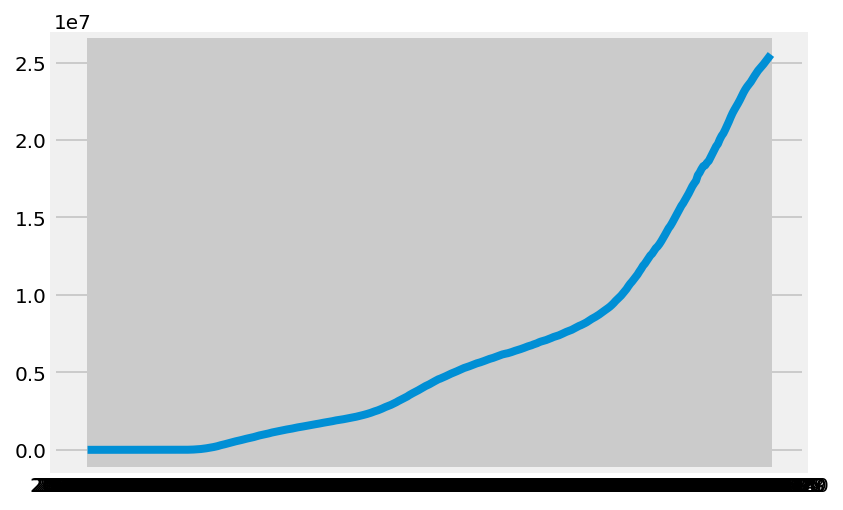

In [72]:
plt.plot(us_covid_df['date'],us_covid_df['cases'])
plt.show()

In [119]:
fig = go.Figure()
fig.add_trace(go.Bar(x=us_covid_df['date'], y=us_covid_df['confirmed_cases'], name='Confirmed Cases of COVID-19', marker_color='rgb(55, 83, 55)'))
#fig.add_trace(go.Bar(x=us_covid['date'],y=us_covid['deaths'],name='Total Deaths because of COVID-19',marker_color='rgb(155, 155, 255)'))

fig.update_layout(title='Confirmed Cases from COVID-19',xaxis_tickfont_size=14,
                  yaxis=dict(title='Reported Numbers',titlefont_size=16,tickfont_size=14,),
    legend=dict(x=0,y=1.0,bgcolor='rgba(255, 255, 255, 0)',bordercolor='rgba(255, 255, 255, 0)'),barmode='group',bargap=0.15, bargroupgap=0.1)
fig.show()

In [106]:
#fig.add_trace(go.Bar(x=us_covid['date'], y=us_covid['cases'], name='Confirmed Cases of COVID-19', marker_color='rgb(55, 83, 109)'))
fig = go.Figure()
fig.add_trace(go.Bar(x=us_covid_df['date'],y=us_covid_df['deaths'],name='Total Deaths because of COVID-19',marker_color='rgb(155, 155, 255)'))

fig.update_layout(title='Number of Deaths from COVID-19',xaxis_tickfont_size=14,
                  yaxis=dict(title='Reported Numbers',titlefont_size=16,tickfont_size=14,),
    legend=dict(x=0,y=1.0,bgcolor='rgba(255, 255, 255, 0)',bordercolor='rgba(255, 255, 255, 0)'),barmode='group',bargap=0.15, bargroupgap=0.1)
fig.show()

In [116]:
#fig.add_trace(go.Bar(x=us_covid['date'], y=us_covid['cases'], name='Confirmed Cases of COVID-19', marker_color='rgb(55, 83, 109)'))
fig = go.Figure()
fig.add_trace(go.Bar(x=us_covid_df['date'],y=us_covid_df['mortality_rate'],name='Total Deaths because of COVID-19',marker_color='rgb(155, 155, 255)'))

fig.update_layout(title='Number of Deaths from COVID-19',xaxis_tickfont_size=14,
                  yaxis=dict(title='Reported Numbers',titlefont_size=16,tickfont_size=14,),
    legend=dict(x=0,y=1.0,bgcolor='rgba(255, 255, 255, 0)',bordercolor='rgba(255, 255, 255, 0)'),barmode='group',bargap=0.15, bargroupgap=0.1)
fig.show()

In [122]:
fig = go.Figure()
fig.add_trace(go.Bar(x=us_covid_df['date'],y=us_covid_df['daily_cases'],name='Total Deaths because of COVID-19',marker_color='rgb(155, 155, 255)'))

fig.update_layout(title='Number of Deaths from COVID-19',xaxis_tickfont_size=14,
                  yaxis=dict(title='Reported Numbers',titlefont_size=16,tickfont_size=14,),
    legend=dict(x=0,y=1.0,bgcolor='rgba(255, 255, 255, 0)',bordercolor='rgba(255, 255, 255, 0)'),barmode='group',bargap=0.15, bargroupgap=0.1)
fig.show()

In [112]:
X=df1[]

In [180]:
X.shape

(22125, 4)

In [114]:
y=cali_Cases["confirmed_cases"]

In [187]:
y.shape

(22125,)

In [191]:
X_train, X_test, y_train, y_test = train_test_split(X[590:], y[590:], test_size=0.05, shuffle=False, random_state= 42)

In [ ]:
svm_confirmed = SVR(shrinking=True, kernel='poly',gamma=0.01, epsilon=1,degree=3, C=0.1)
svm_confirmed.fit(X_train, y_train)

In [393]:
df1=df.pivot_table( index=["countyFIPS"], columns='date', values=['confirmed_cases'])
df1.reset_index(inplace=True)
df1.tail()


countyFIPS confirmed_cases                                              \
date                 2020-01-22 2020-01-23 2020-01-24 2020-01-25 2020-01-26   
3140      56037               0          0          0          0          0   
3141      56039               0          0          0          0          0   
3142      56041               0          0          0          0          0   
3143      56043               0          0          0          0          0   
3144      56045               0          0          0          0          0   

                                                  ...                        \
date 2020-01-27 2020-01-28 2020-01-29 2020-01-30  ... 2021-01-21 2021-01-22   
3140          0          0          0          0  ...       3370       3384   
3141          0          0          0          0  ...       2847       2870   
3142          0          0          0          0  ...       1874       1887   
3143          0          0          0          0  ...        848        853   
3144          0          0          0          0  ...        609        609   

                                                                        \
date 2021-01-23 2021-01-24 2021-01-25 2021-01-26 2021-01-27 2021-01-28   
3140       3384       3411       3418       3421       3428       3440   
3141       2870       2931       2981       2993       3020       3028   
3142       1887       1900       1913       1925       1948       1957   
3143        853        858        861        863        864        864   
3144        609        609        609        609        610        610   

                            
date 2021-01-29 2021-01-30  
3140       3464       3472  
3141       3078       3078  
3142       1959       1960  
3143        864        864  
3144        610        610  

[5 rows x 376 columns]

In [397]:
df1

countyFIPS confirmed_cases                                              \
date                 2020-01-22 2020-01-23 2020-01-24 2020-01-25 2020-01-26   
0             1               0          0          0          0          0   
1          1001               0          0          0          0          0   
2          1003               0          0          0          0          0   
3          1005               0          0          0          0          0   
4          1007               0          0          0          0          0   
5          1009               0          0          0          0          0   
6          1011               0          0          0          0          0   
7          1013               0          0          0          0          0   
8          1015               0          0          0          0          0   
9          1017               0          0          0          0          0   
10         1019               0          0          0          0          0   
11         1021               0          0          0          0          0   
12         1023               0          0          0          0          0   
13         1025               0          0          0          0          0   
14         1027               0          0          0          0          0   
15         1029               0          0          0          0          0   
16         1031               0          0          0          0          0   
17         1033               0          0          0          0          0   
18         1035               0          0          0          0          0   
19         1037               0          0          0          0          0   
20         1039               0          0          0          0          0   
21         1041               0          0          0          0          0   
22         1043               0          0          0          0          0   
23         1045               0          0          0          0          0   
24         1047               0          0          0          0          0   
25         1049               0          0          0          0          0   
26         1051               0          0          0          0          0   
27         1053               0          0          0          0          0   
28         1055               0          0          0          0          0   
29         1057               0          0          0          0          0   
...         ...             ...        ...        ...        ...        ...   
3115      55129               0          0          0          0          0   
3116      55131               0          0          0          0          0   
3117      55133               0          0          0          0          0   
3118      55135               0          0          0          0          0   
3119      55137               0          0          0          0          0   
3120      55139               0          0          0          0          0   
3121      55141               0          0          0          0          0   
3122      56001               0          0          0          0          0   
3123      56003               0          0          0          0          0   
3124      56005               0          0          0          0          0   
3125      56007               0          0          0          0          0   
3126      56009               0          0          0          0          0   
3127      56011               0          0          0          0          0   
3128      56013               0          0          0          0          0   
3129      56015               0          0          0          0          0   
3130      56017               0          0          0          0          0   
3131      56019               0          0          0          0          0   
3132      56021               0          0          0  

In [341]:
fip=df1[df1['countyFIPS']==1001]

In [347]:
df1['countyFIPS'][1]

1001

In [400]:
dates=df['date'].unique()
dates
df['date'].nunique()

SyntaxError: invalid syntax (<ipython-input-400-6fd9e3abfae6>, line 2)

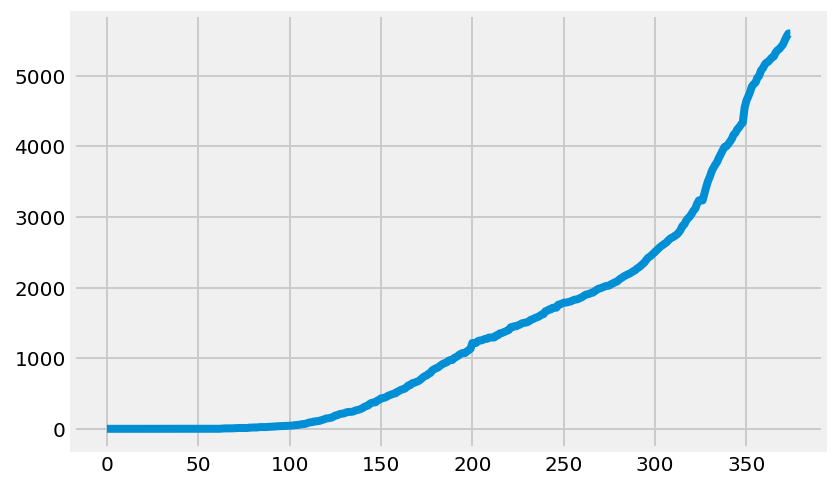

In [401]:
ala=df1[df1['countyFIPS']==1001]
y=np.array([ i for i in range(len(dates))])   
alacases=[]
for date in dates:
    alacases.append(ala["confirmed_cases"][date][1])
    #print(ala["confirmed_cases"][date][3144])
plt.plot(y, alacases)

In [410]:
alacases=np.array(alacases).reshape(-1,1)
y=y.reshape(-1,1)

In [411]:
X_train, X_test, y_train, y_test = train_test_split(y[50:],alacases[50:], test_size=0.05, shuffle=False, random_state= 42)

In [412]:
svm_confirmed = SVR(shrinking=True, kernel='poly',gamma=0.01, epsilon=1,degree=3, C=0.1)
svm_confirmed.fit(X_train, y_train)
X_pred=svm_confirmed.predict(X_test)

In [413]:
X_pred

array([4704.18309779, 4743.7156176 , 4783.46899126, 4823.443831  ,
       4863.64075661, 4904.0603681 , 4944.703302  , 4985.57016344,
       5026.66156257, 5067.97811983, 5109.52045003, 5151.28917674,
       5193.28490109, 5235.5082464 , 5277.959817  , 5320.64024258,
       5363.55013225])

MAE: 301.2836013951296
MSE: 92674.45284739842


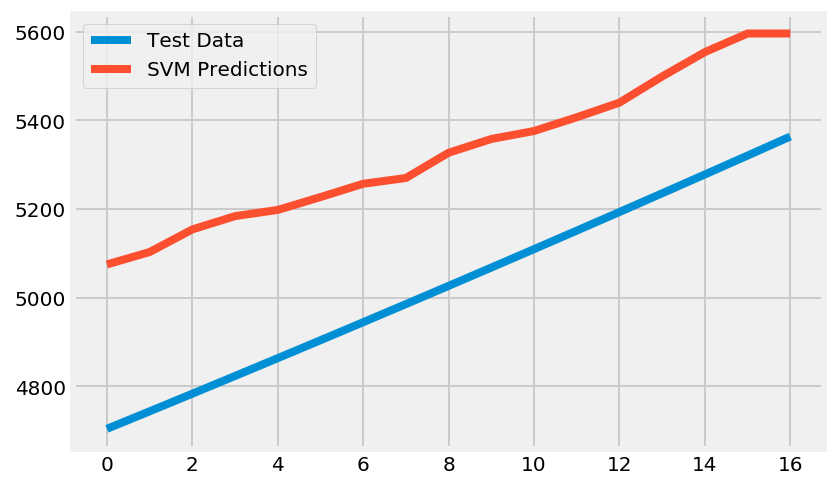

In [419]:
plt.plot(X_pred)
plt.plot(y_test)
plt.legend(['Test Data', 'SVM Predictions'])
print('MAE:', mean_absolute_error(X_pred, y_test))
print('MSE:',mean_squared_error(X_pred, y_test))

In [390]:
ala=df1[df1['countyFIPS']==1007]
y=np.array([ i for i in range(len(dates))])   
alacases=[]
ala["confirmed_cases"]['2020-01-22'][4]
#for date in dates:
#    alacases.append(ala["confirmed_cases"][date][1])

#plt.scatter(y, alacases)

0

In [365]:
ala["confirmed_cases"][dates]

date,2020-01-22,2020-01-23,2020-01-24,2020-01-25,2020-01-26,2020-01-27,2020-01-28,2020-01-29,2020-01-30,2020-01-31,...,2021-01-21,2021-01-22,2021-01-23,2021-01-24,2021-01-25,2021-01-26,2021-01-27,2021-01-28,2021-01-29,2021-01-30
1,0,0,0,0,0,0,0,0,0,0,...,5270,5327,5358,5376,5407,5440,5499,5554,5596,5596


In [349]:
us_resi_elec_sales_df=df.pivot_table( index=["state"], columns='month', values=['Electricity_Sales_ Revenue_Residential ($ x1000)'])
us_resi_elec_sales_df.reset_index(inplace=True)
us_resi_elec_sales_df.tail(10)

state Electricity_Sales_ Revenue_Residential ($ x1000)  \
month                                                               1   
41      South Dakota                                       113249.734   
42         Tennessee                                       795059.010   
43             Texas                                      2643219.952   
44              Utah                                       167476.150   
45           Vermont                                        76848.436   
46          Virginia                                      1081197.440   
47        Washington                                       761754.742   
48     West Virginia                                       248670.620   
49         Wisconsin                                       607424.722   
50           Wyoming                                        64015.022   

                                                                        \
month            2            3            4            5            6   
41      103848.544    97306.162    89426.430    79931.558    93294.258   
42      787472.384   694281.384   591472.482   599231.190   766817.428   
43     2565302.252  2405231.392  2383942.738  2785831.880  3625146.430   
44      152204.006   142571.606   134743.610   156718.970   190514.912   
45       72329.474    69042.802    63809.470    61517.484    66831.766   
46      903389.634   804369.854   712663.274   754965.656  1017530.560   
47      677442.272   696589.550   572737.944   490989.872   495475.220   
48      237751.994   203879.678   179784.746   192696.914   192610.198   
49      532860.718   525640.002   495130.152   502818.642   599291.600   
50       60901.642    56906.732    51341.472    43943.312    47329.854   

                                                                          
month             7            8             9           10           11  
41     1.119004e+05   111625.840  8.906573e+04    86268.788    90961.834  
42     9.834275e+05   984218.450  8.545052e+05   608142.580   601512.338  
43     4.397368e+06  4364859.640  3.753973e+06  2808459.604  2297071.754  
44     2.682146e+05   295267.334  1.942434e+05   152228.612   153302.302  
45     8.059167e+04    73225.780  6.201925e+04    63088.616    66647.340  
46     1.329246e+06  1212641.416  8.481610e+05   607951.554   759473.864  
47     5.407206e+05   512903.896  4.752325e+05   525163.372   622666.674  
48     2.543044e+05   228002.310  1.863115e+05   171453.196   196476.436  
49     7.619049e+05   648175.806  4.780678e+05   472493.278   523821.420  
50     5.484224e+04    53788.924  4.385793e+04    46347.552    51981.498

In [309]:
us_resi_elec_sales_df.describe

Electricity_Sales_ Revenue_Residential ($ x1000)                \
month                                               1             2    
count                                     5.100000e+01  5.100000e+01   
mean                                      6.240340e+05  5.640009e+05   
std                                       6.338954e+05  5.596047e+05   
min                                       5.635217e+04  4.624586e+04   
25%                                       1.716945e+05  1.507213e+05   
50%                                       4.455648e+05  3.974209e+05   
75%                                       7.784069e+05  7.024562e+05   
max                                       3.149081e+06  2.565302e+06   

                                                                             \
month            3             4             5             6             7    
count  5.100000e+01  5.100000e+01  5.100000e+01  5.100000e+01  5.100000e+01   
mean   5.337482e+05  5.077332e+05  5.437843e+05  6.833198e+05  8.676060e+05   
std    5.557183e+05  5.455694e+05  6.012509e+05  7.604654e+05  9.552515e+05   
min    4.345263e+04  4.097419e+04  4.394331e+04  4.732985e+04  5.484224e+04   
25%    1.420133e+05  1.347020e+05  1.410378e+05  1.672485e+05  2.133995e+05   
50%    3.997398e+05  3.726004e+05  4.008994e+05  4.895740e+05  5.883213e+05   
75%    6.867313e+05  6.058440e+05  6.318627e+05  8.717357e+05  1.171697e+06   
max    2.590639e+06  2.383943e+06  2.785832e+06  3.625146e+06  4.397368e+06   

                                                               
month            8             9             10            11  
count  5.100000e+01  5.100000e+01  5.100000e+01  5.100000e+01  
mean   8.292207e+05  6.777924e+05  5.627103e+05  5.202080e+05  
std    9.456841e+05  8.584914e+05  7.182524e+05  5.535367e+05  
min    5.378892e+04  4.385793e+04  4.534019e+04  4.481987e+04  
25%    2.053936e+05  1.652609e+05  1.346229e+05  1.495642e+05  
50%    5.690235e+05  4.597181e+05  3.849524e+05  3.980062e+05  
75%    1.111150e+06  8.346259e+05  6.069327e+05  6.058437e+05  
max    4.364860e+06  4.249303e+06  3.807147e+06  2.501717e+06

In [82]:
month=df['month'].unique()
month=month[:11]

670692.3019999906
621194.2400000081
562578.1039999888
508708.7200000208
582263.3440000003
752936.4360000252
910204.5899999691
910691.75
758138.0720000215
558692.2960000035
534707.0039999769


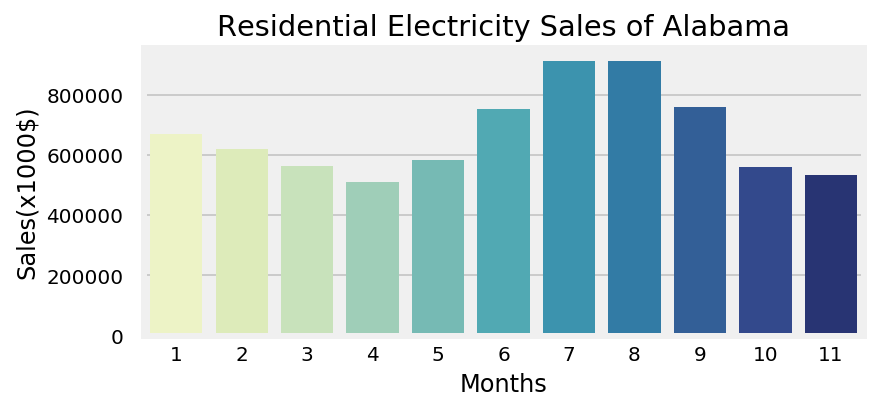

104761.99799999972
87120.40399999927
86319.4159999996
75771.56599999967
69882.78000000081
66985.07199999887
69631.20199999961
69199.62799999902
68272.25599999892
74396.17800000138
88352.0699999991


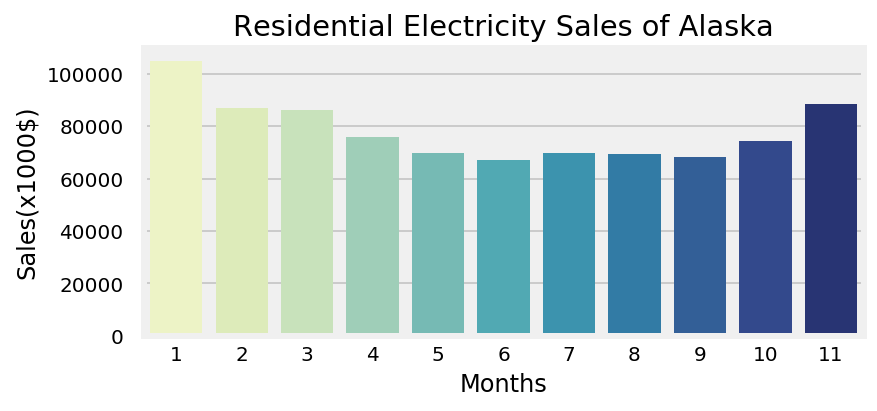

575094.4980000004
504599.3540000017
477280.9300000049
583457.6240000055
901424.9840000083
1029209.3579999942
1328550.4859999935
1334963.7180000034
1006707.7319999945
744119.4120000004
510518.08399999805


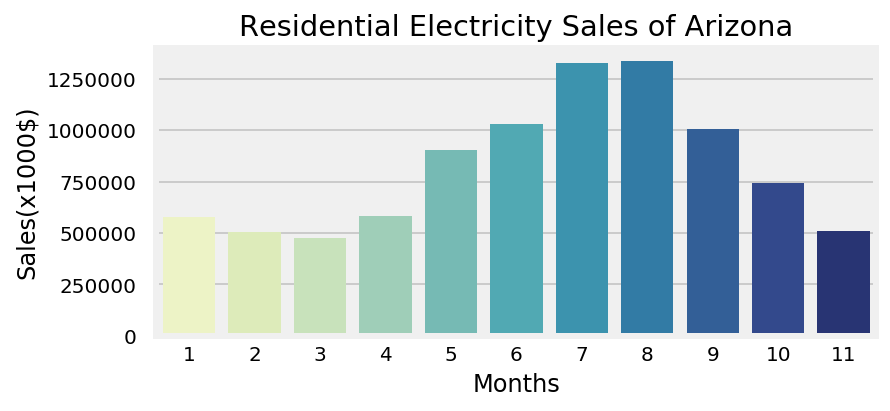

329735.33199999505
310860.0099999928
281573.9639999897
240596.52999998612
241875.53200000184
320674.734000001
427182.69200000726
419818.9780000141
372949.9220000142
269674.26599999395
244811.27799999734


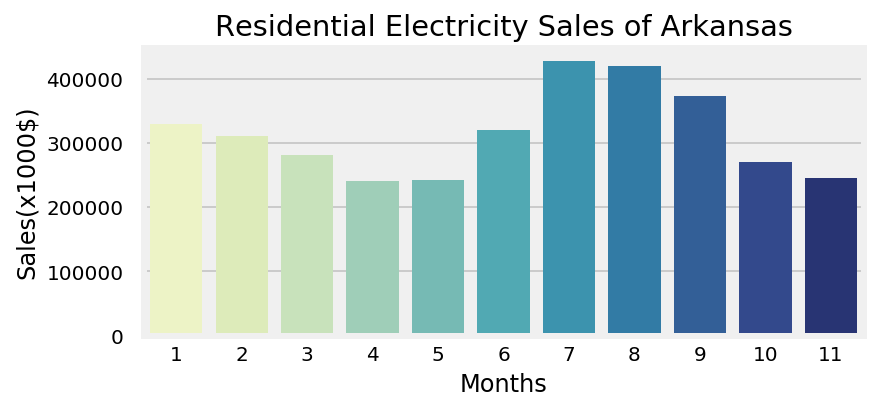

3149080.9379999773
2405298.5599999507
2590639.2659998974
2276860.1319999755
2774530.2440000367
3184820.6619999805
4207898.871999941
4302171.489999836
4249303.479999814
3807147.2860000306
2501716.5760000995


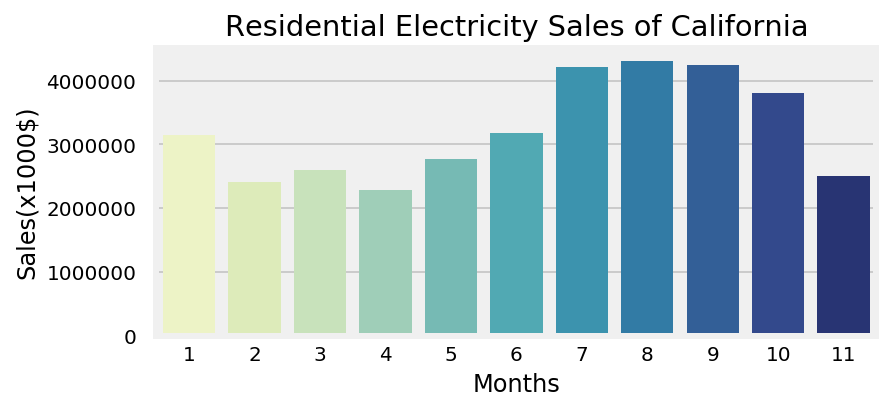

397453.272000007
365212.38200000493
356559.77400000574
333022.9859999918
370900.87000000424
486491.657999994
577010.0420000277
582574.975999986
470401.2899999901
386770.7159999942
371271.8200000083


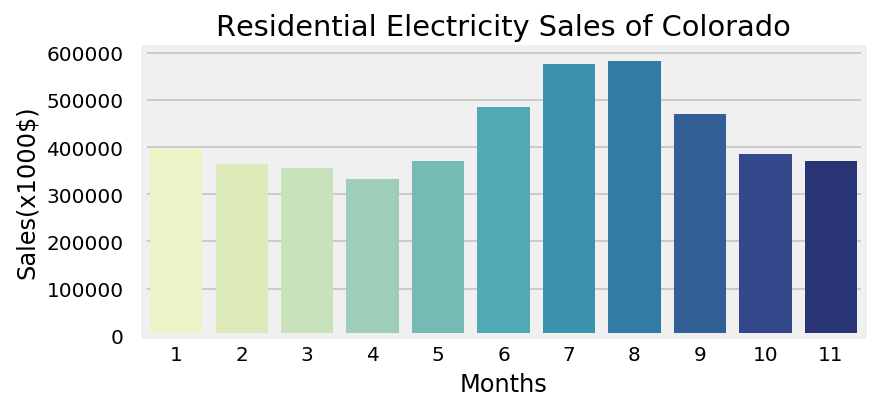

513232.8940000006
469221.0980000012
436730.6319999994
439806.4399999986
419242.0419999994
509299.74799999903
701206.0819999983
619095.2000000003
444084.88600000273
378632.7199999991
398006.1840000003


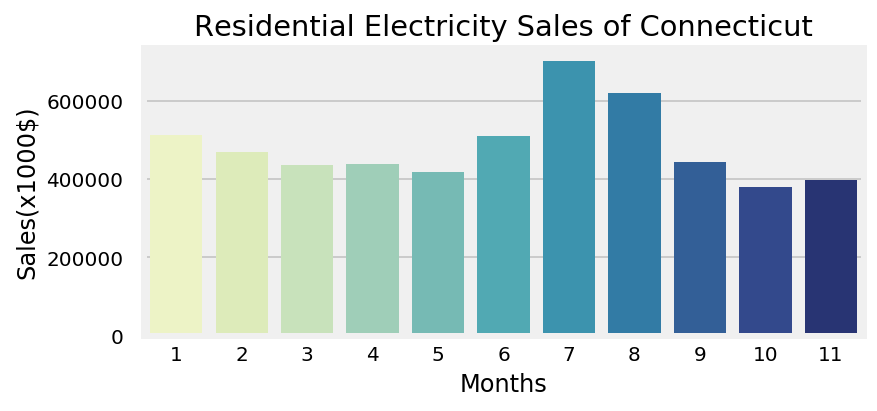

103807.10399999998
101930.33200000018
98256.42600000006
88550.966
91409.08800000022
107935.08800000012
136266.46000000028
134430.01799999984
115563.85600000001
89237.54600000007
82774.0219999999


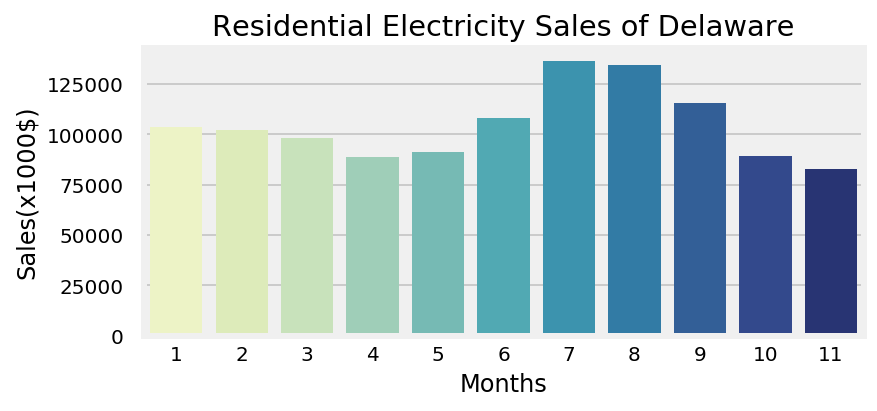

56352.17400000001
46245.860000000015
43452.629999999976
40974.193999999996
46602.71399999999
50991.337999999996
71869.23399999997
65021.19999999997
55359.222000000016
45340.19399999998
44819.873999999996


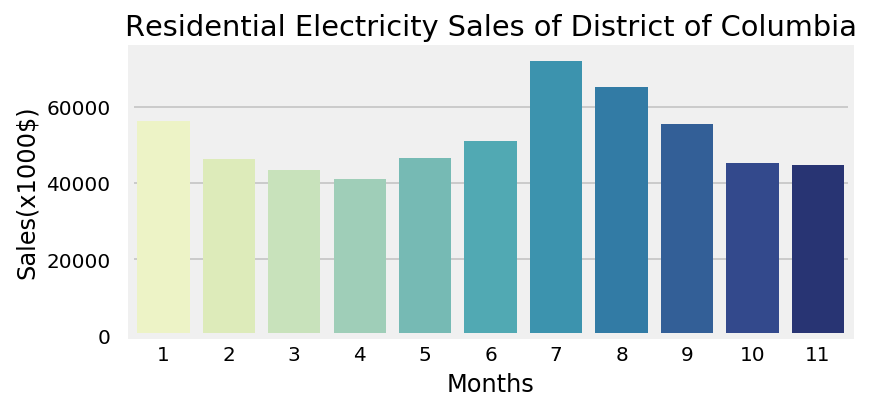

2055328.2300000144
1940534.4400000486
2083573.5560001107
2338830.4479999607
2084674.9559999455
2863015.5719999042
3302322.7539999383
3285786.4519999074
3058399.003999965
2613181.484000116
2284428.2519999403


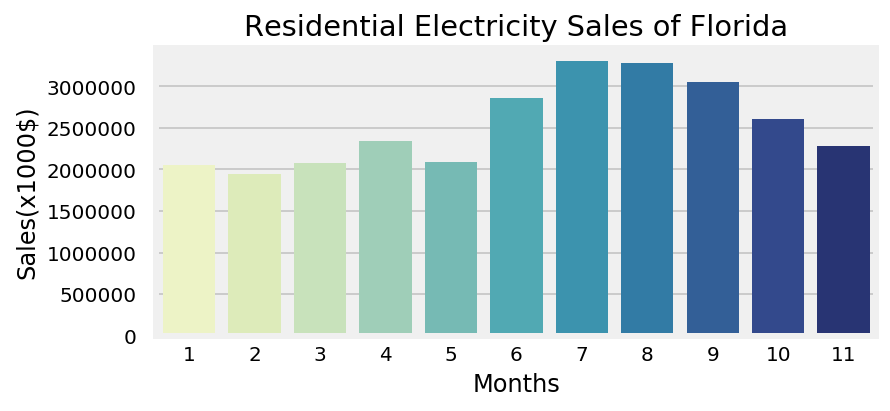

1070178.3039999723
1002072.2560000027
924854.8219999974
829424.1579999927
1019110.0500000948
1372144.793999925
1744556.9259998656
1697341.8280000568
1276842.0319999084
965189.1719999518
873562.3159999863


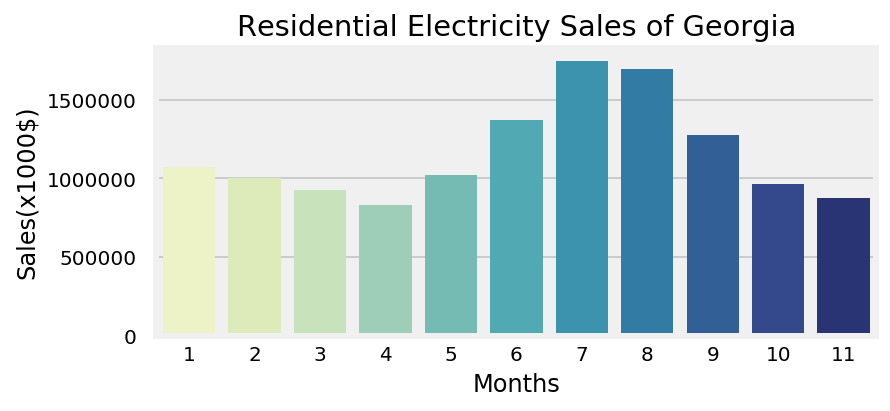

151798.45000000013
128065.07999999989
138112.0579999998
134139.95199999967
141343.96000000054
143969.9620000001
141491.64400000012
147542.62799999974
150302.8680000004
154441.70399999994
145826.17199999976


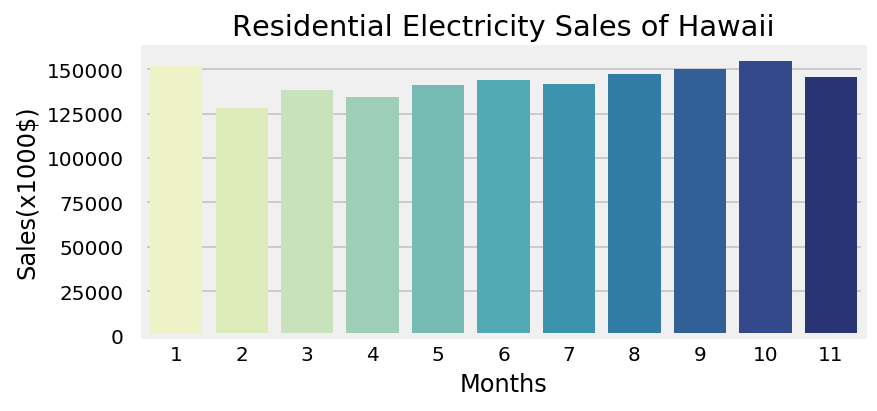

180383.67800000162
156355.3280000014
142889.877999999
123142.37999999769
117113.21200000051
131074.0479999992
170188.64399999587
161060.36599999724
117691.35799999985
126531.15200000074
154569.09999999634


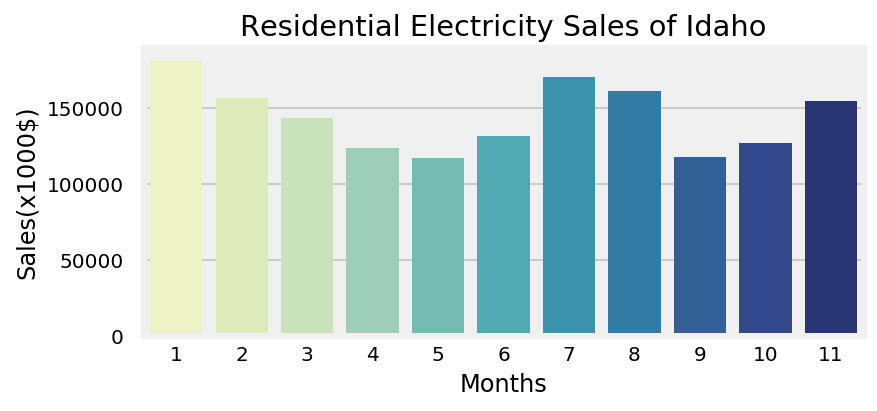

988709.8059999947
934825.5460000037
852052.5359999642
796043.1900000442
916798.6399999997
1171830.291999951
1433096.768000016
1278372.6459999382
840123.4460000518
843319.8139999851
829929.0619999898


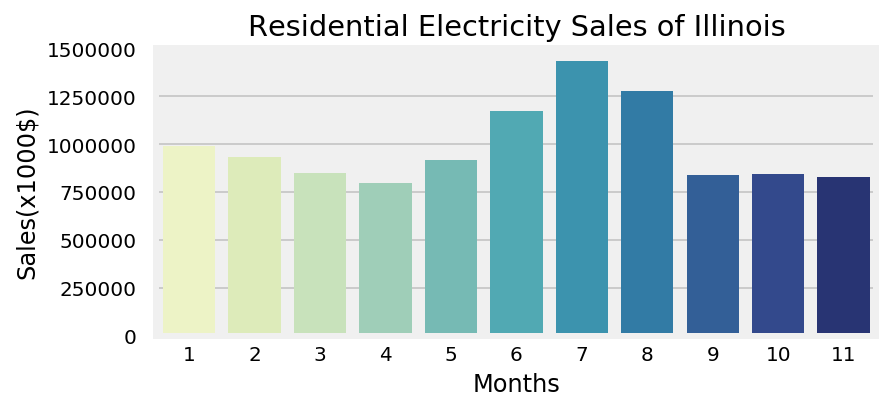

713619.2779999974
673429.0220000199
604898.9219999879
541787.6199999708
555978.8199999941
730708.687999976
894346.0
816759.696000047
665588.0999999702
605418.6340000073
589719.7379999798


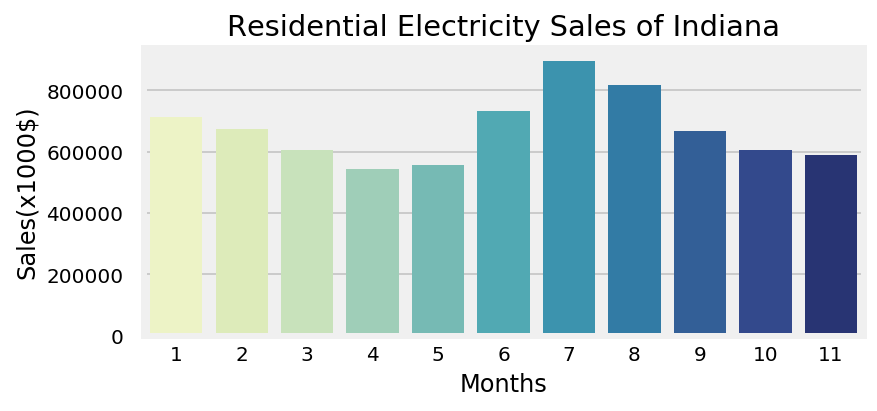

346648.5419999969
298036.44400000514
280105.45399999665
259155.7539999881
266403.733999997
344130.74000000797
453844.7439999766
408368.7439999787
275991.7680000061
236550.14400000998
254540.30999998495


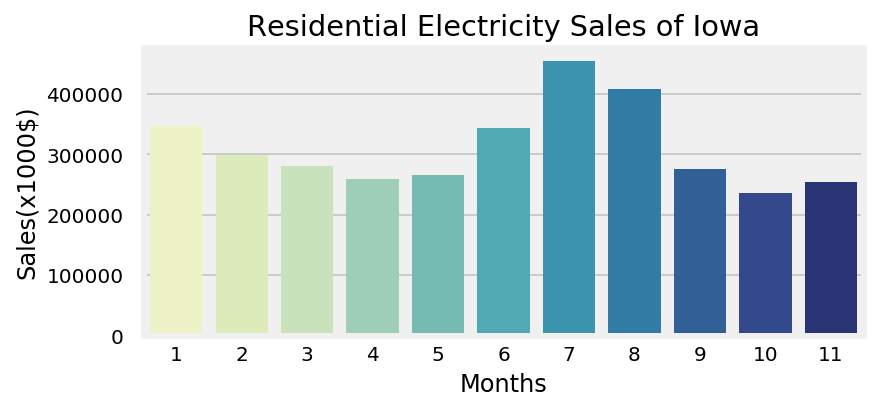

267358.4320000032
247973.20599998106
226547.54799998688
217168.34200000545
241485.20000000938
384232.15599999955
441943.3619999899
401921.7219999814
285252.4739999855
249470.1119999909
222145.75399999207


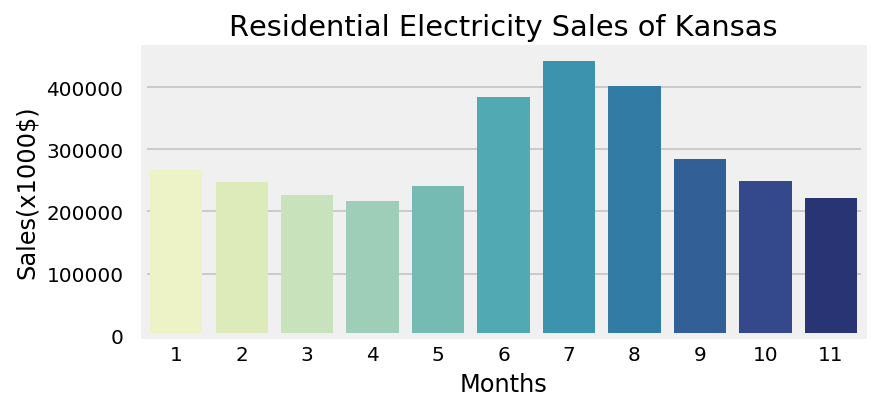

516924.41199999244
482932.57599997974
421381.2200000235
372600.4200000002
400899.4179999869
489574.0460000035
628077.4159999435
569023.5220000282
466292.72799998394
384952.4279999788
400593.28399999096


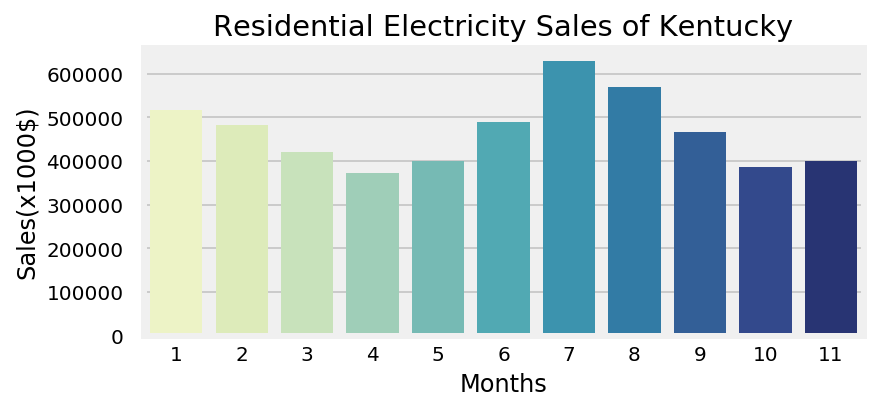

445564.7960000024
397420.8880000089
383283.5759999852
377669.570000009
433493.79600000335
557167.922000022
658403.3039999938
661718.2760000171
613496.3200000152
486520.23000001244
402750.4440000051


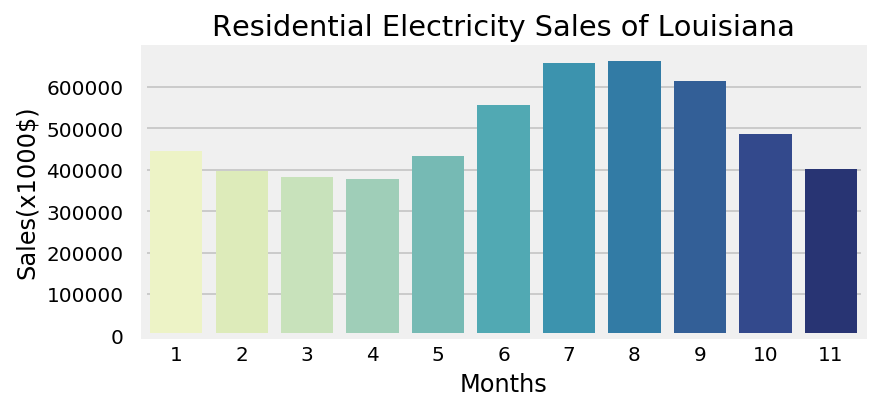

162758.87200000038
135379.19200000117
140056.13000000097
134660.4699999992
120730.899999999
125605.40399999931
152400.68999999893
162889.6580000011
132143.30799999883
122163.600000001
113190.07599999939


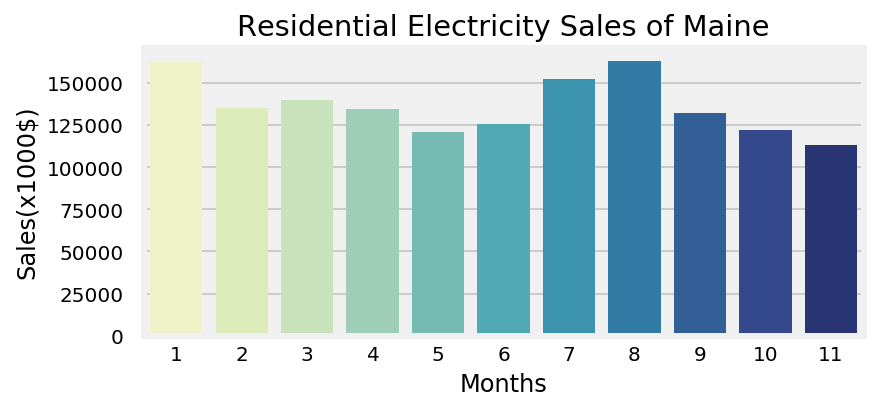

687138.5840000007
609681.0759999931
533295.1819999969
477540.5740000009
496681.818000002
605679.9559999887
796687.4940000018
720590.0559999952
537042.0920000038
455804.47399999923
496133.3240000009


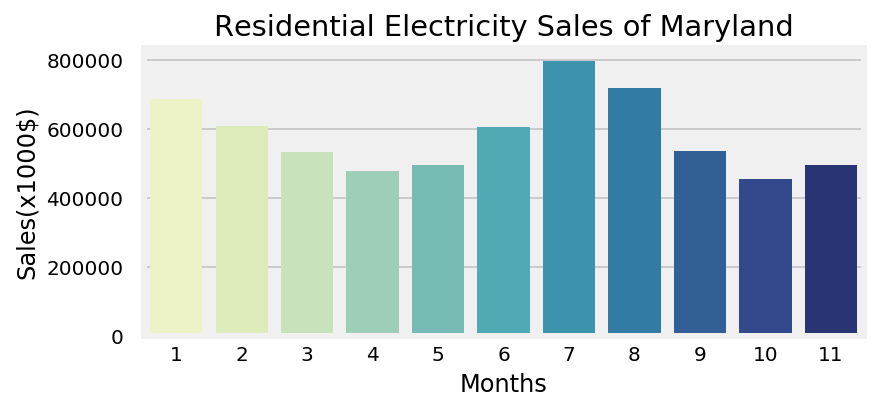

807545.7639999989
727470.0360000066
679181.1480000014
673671.066000006
631849.187999996
689989.2639999987
967553.5600000022
1013589.8619999929
755284.1259999931
605913.7840000035
610174.9860000013


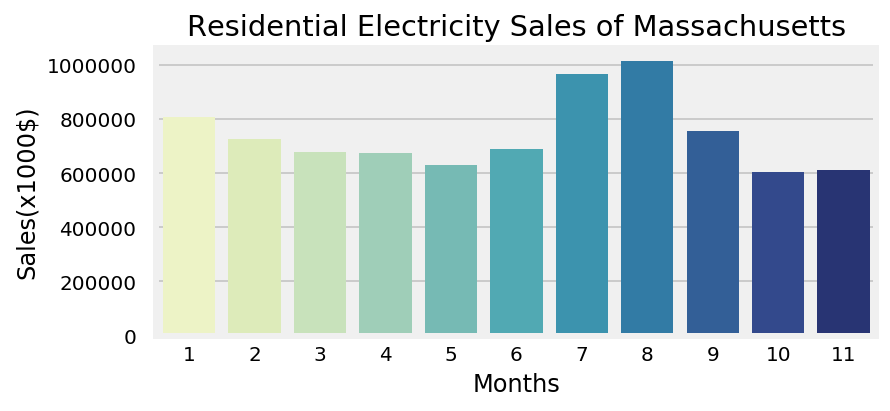

926848.6299999958
871896.7400000087
858082.9600000265
814357.3380000433
842854.06999998
1120948.6420000242
1459524.4780000537
1208710.4759999653
847866.2720000279
843990.9000000397
850069.670000028


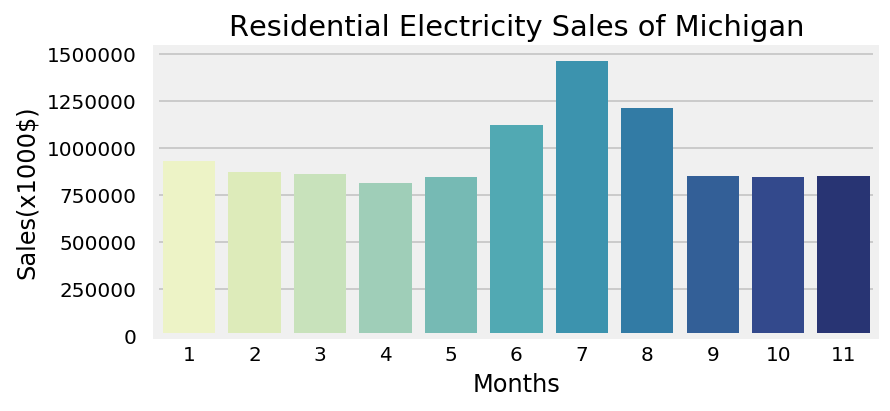

545673.7059999872
487254.1779999797
472043.82200002053
436069.80599999474
426633.605999974
556730.417999987
663374.1300000432
602530.4839999825
459718.11600001715
442540.47800000774
445345.4320000097


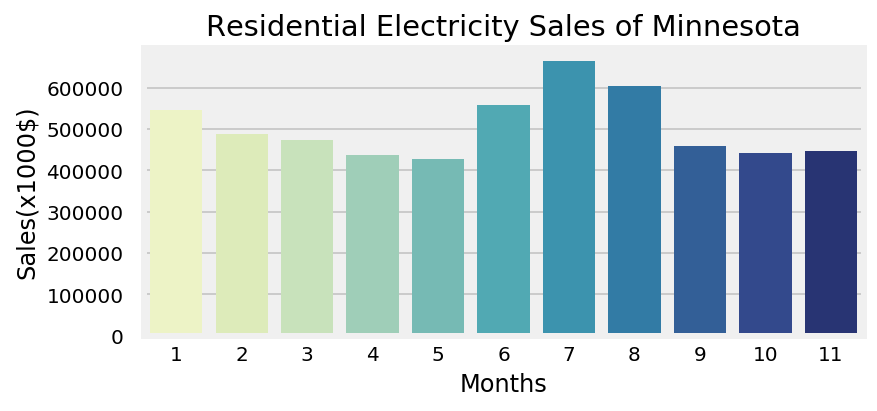

350855.1419999974
321757.05799999996
304458.30599999486
275874.1759999991
298743.66199998296
382328.7259999836
458433.5920000063
459049.6319999901
412658.8140000089
310478.9500000095
286426.78999999806


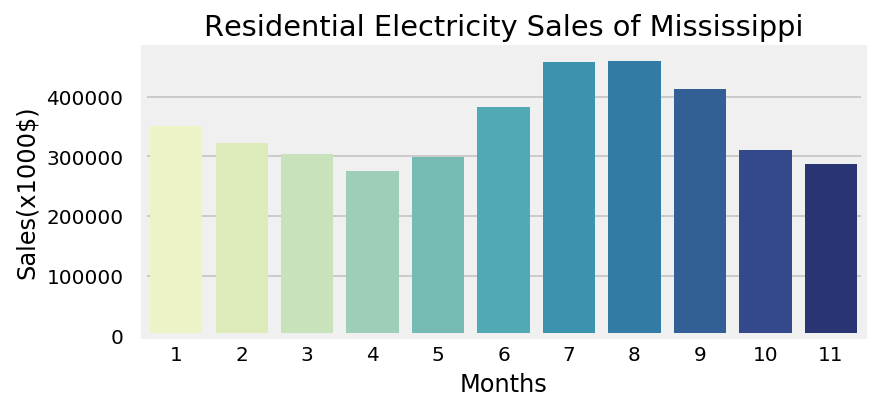

639017.5839999935
573559.8280000177
509397.7260000168
454497.6199999669
547480.2660000201
827386.0879999889
1014843.9439999086
867711.8819999773
596345.1919999628
507686.5179999579
472592.62800001696


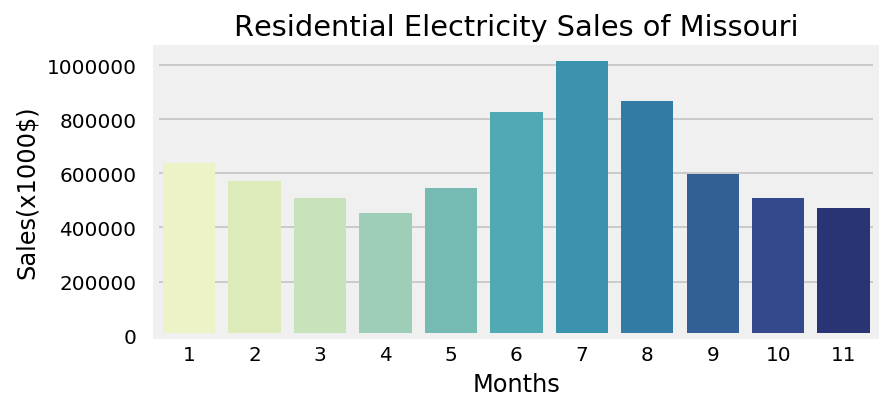

127758.7299999989
112307.06999999558
108276.14599999836
101568.97400000402
85614.92200000124
86383.30199999978
96538.91999999863
105177.05199999698
90173.22200000208
84332.56999999625
103798.05599999697


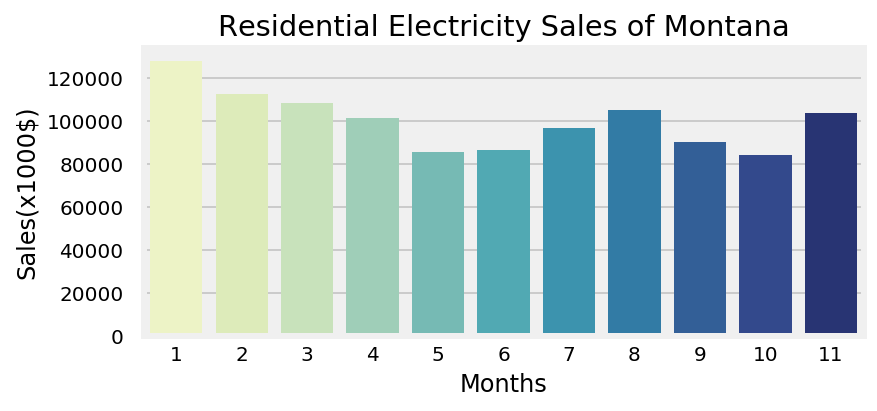

199590.08799999955
180892.519999994
174189.85600000524
153863.3259999929
150776.52200001018
212060.0420000019
267961.8899999883
229650.12800001117
188322.5
154988.88999999015
158191.79400001146


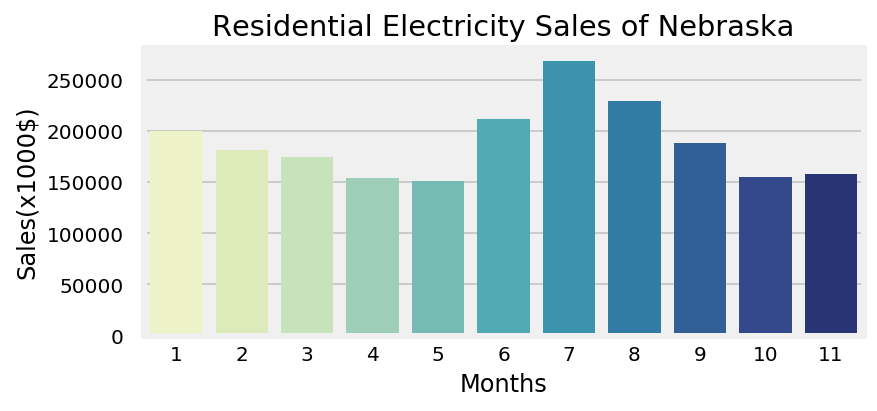

213934.75199999998
189540.37000000052
184939.89800000095
191061.37000000066
269047.55799999856
334416.60400000156
424419.9639999955
444467.7520000024
350519.87000000256
83264.87400000013
189370.99799999988


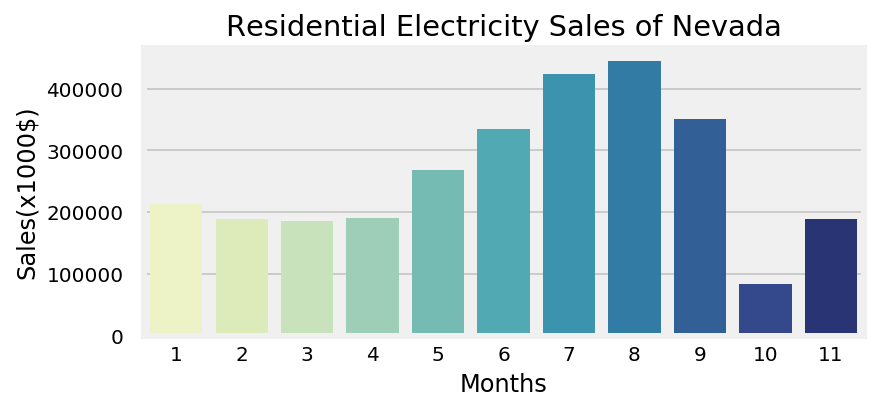

175912.82399999961
149238.6279999992
141454.91200000033
136170.35599999936
138797.92800000033
149973.20000000036
190083.84200000015
182784.9319999985
132317.58199999985
124576.80200000045
135938.54800000036


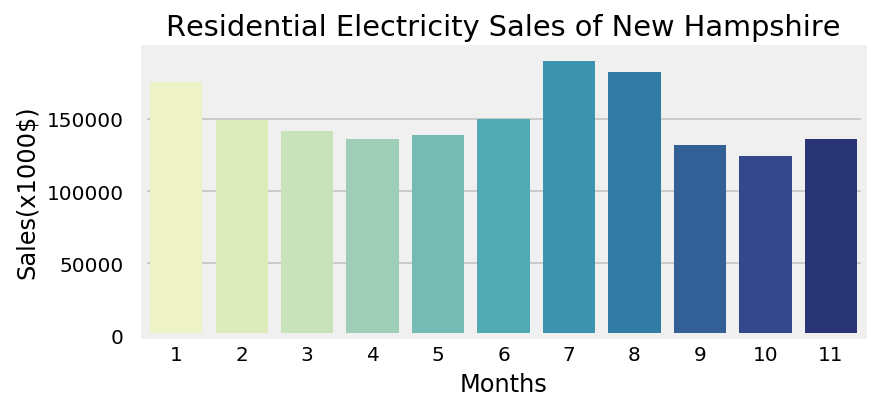

703361.7919999984
619108.1540000002
597317.4720000025
620215.5759999946
631876.1480000017
916085.2419999944
1438635.6460000193
1233569.1540000115
829128.3360000107
563503.431999998
596831.8059999956


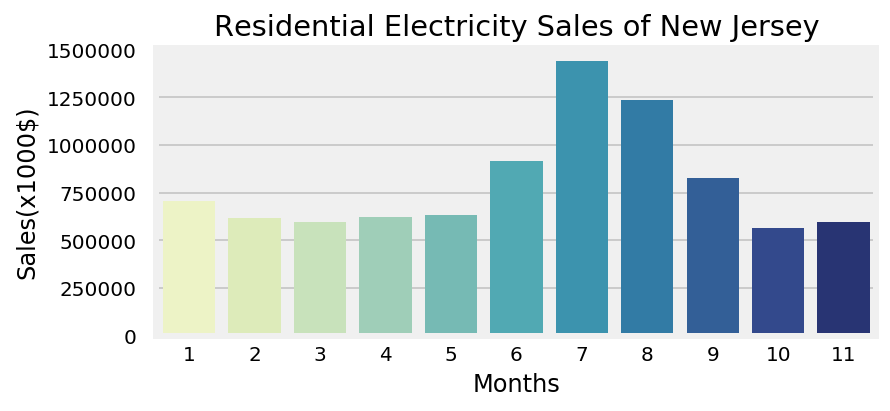

157117.41399999935
134051.90399999922
117933.76199999788
113094.7240000025
140731.72200000205
184523.7919999978
236715.1780000026
235832.88999999396
180218.84000000285
142714.67399999773
134556.54000000286


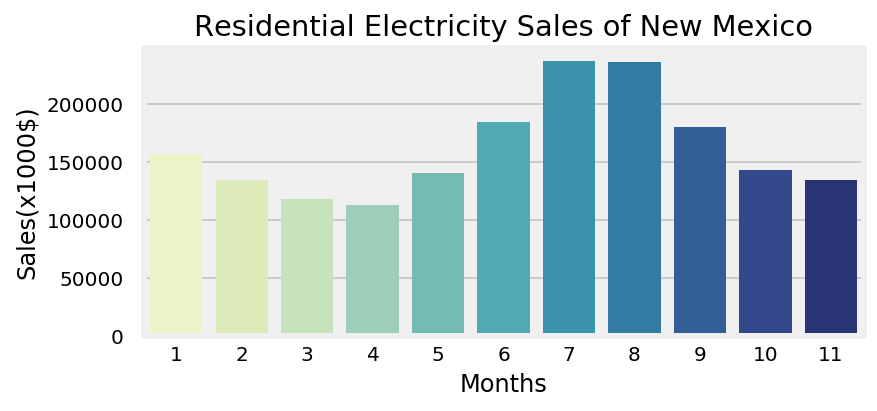

1527169.1039999807
1368325.8299999647
1304605.3220000234
1232823.460000027
1319898.173999982
1672854.07000004
2286441.2299999995
2193627.1199999154
1817305.018000014
1461863.6440000422
1370425.9519999903


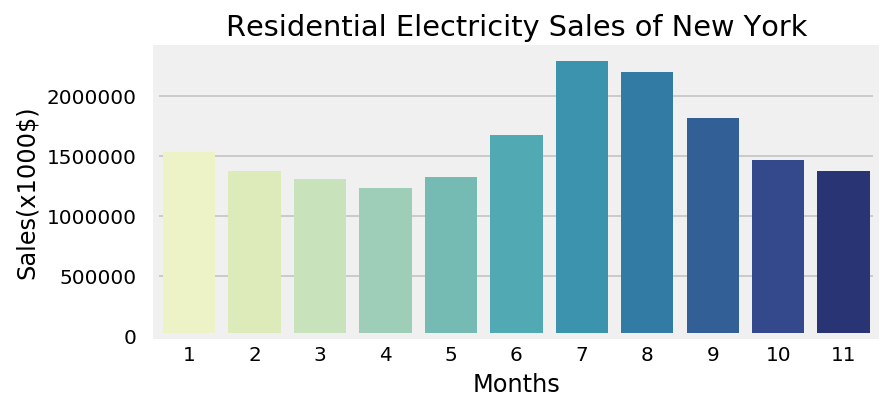

1179494.266000012
1109755.6339999537
956867.8920000345
910641.1020000491
944973.8239999254
1188018.035999918
1520753.28800008
1440057.5999999498
1186021.3800000786
943263.3139999979
899523.1700000385


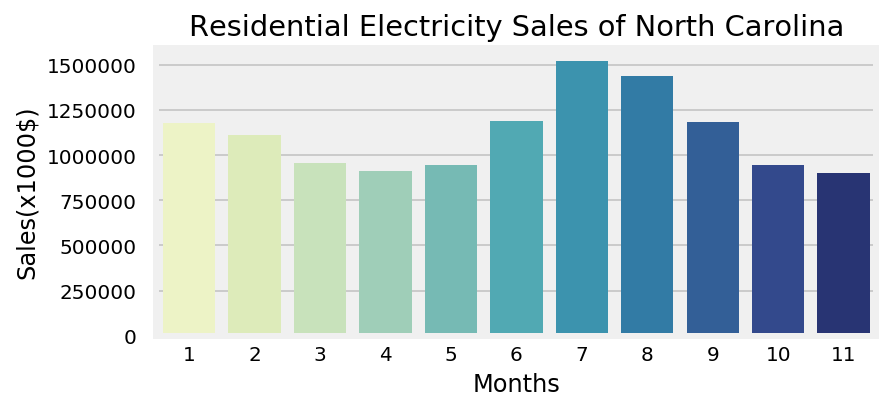

108342.77000000114
95343.89200000078
92279.14200000041
82321.62999999827
73953.01199999786
79944.85600000246
91105.65199999932
87043.95200000264
74603.40199999847
75754.62199999773
86180.67399999792


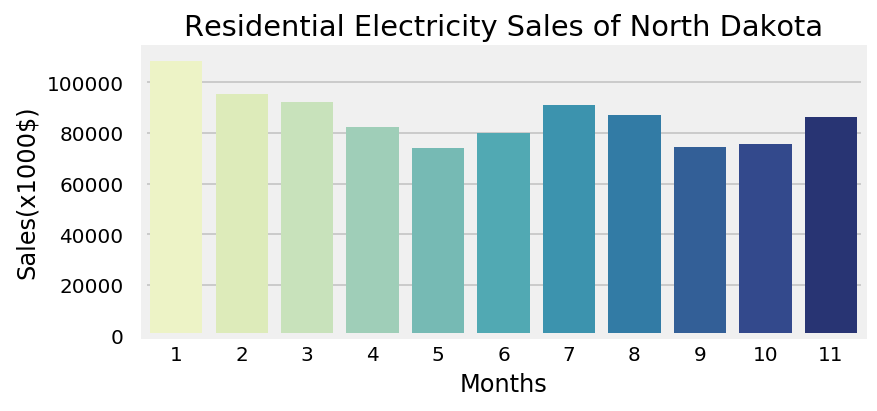

1119225.259999992
1071296.7820000295
904354.5700000033
893605.5499999864
917623.6640000246
1109340.2459999775
1479004.314000034
1280903.0
979956.6040000451
904464.0760000093
890607.7799999954


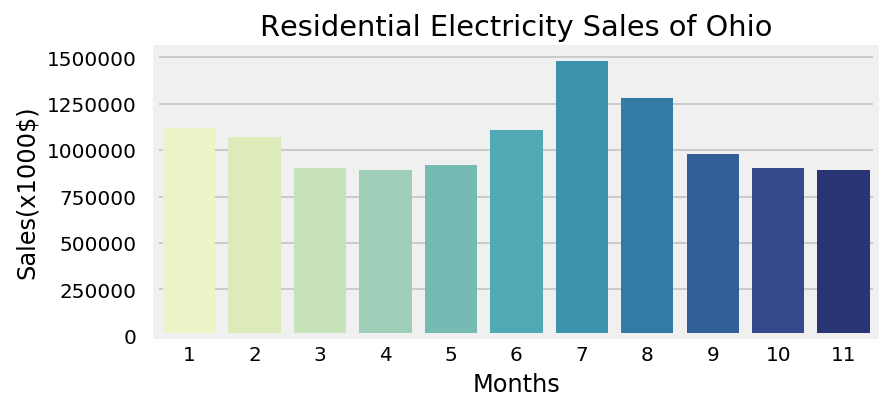

359647.9219999965
342029.0340000057
311185.73400000005
298373.76999999024
325365.36399999436
487081.03999998455
588321.2640000074
558804.4360000141
427810.633999976
328999.05799999915
303766.447999997


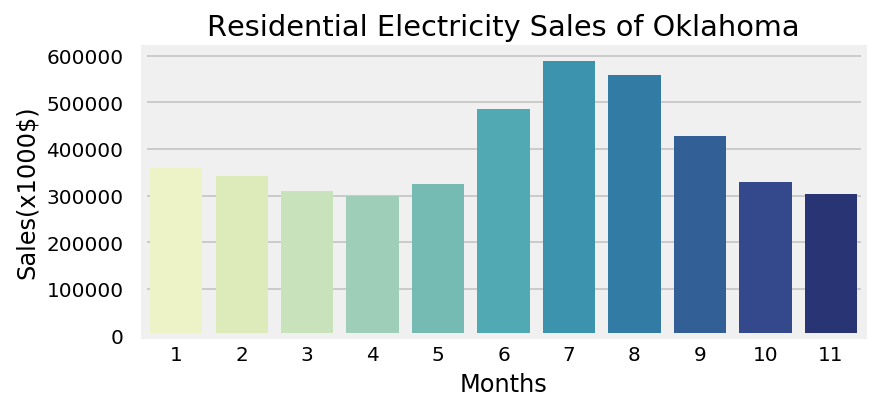

428669.52200000186
392992.89999999455
399739.7900000069
328019.4920000008
314238.35000000236
308628.0879999996
358341.3799999962
356375.2099999949
309243.5660000027
320545.0959999989
396434.36799998954


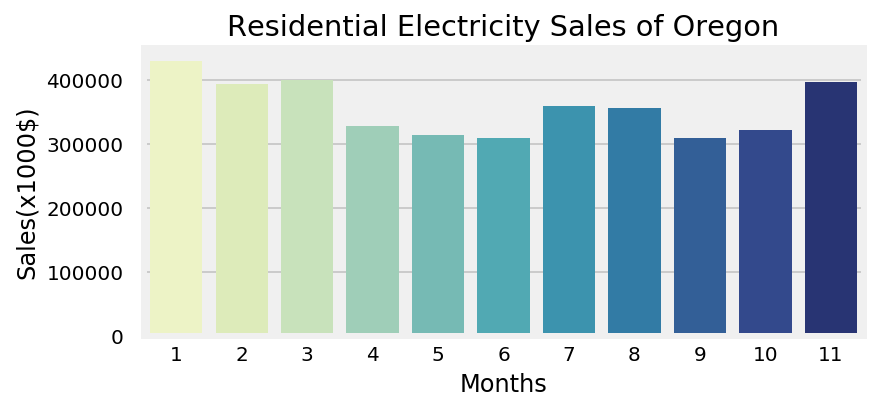

1429216.6080000133
1296466.2960000036
1099628.1559999664
1113661.895999962
1063352.3239999395
1183504.3979999786
1617334.0720000241
1512666.3639999735
1165511.9500000149
998491.3420000068
1073759.2400000074


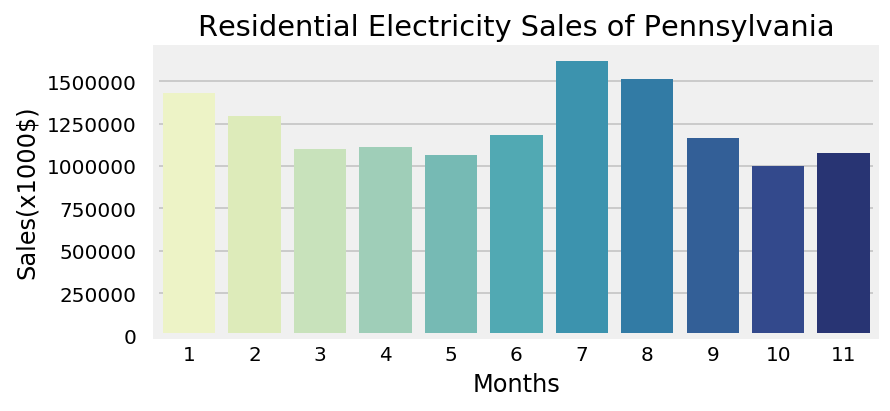

125492.75600000004
102043.59999999976
99063.88800000017
97391.91799999973
94338.11400000005
103979.5879999999
154121.64200000057
169631.42399999968
118540.41200000013
98987.43200000002
102863.2280000001


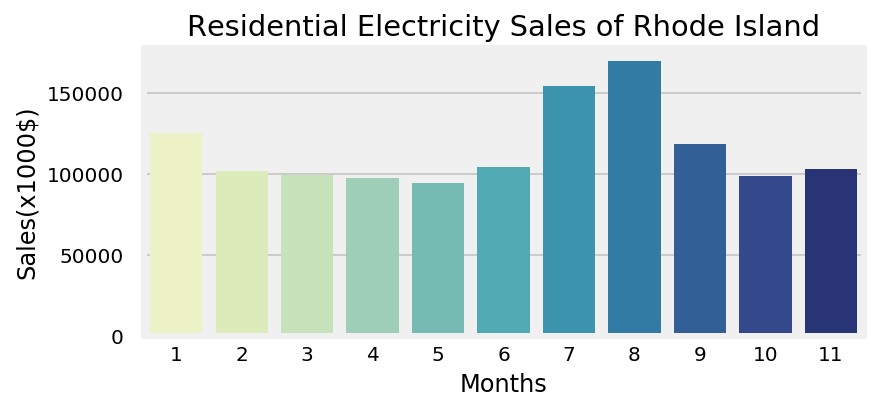

655321.0740000008
606827.7200000188
545896.8580000071
502144.72000001714
553358.7400000074
731812.9259999992
904696.2560000219
874021.6900000316
700484.5499999835
562712.6820000088
515469.1260000044


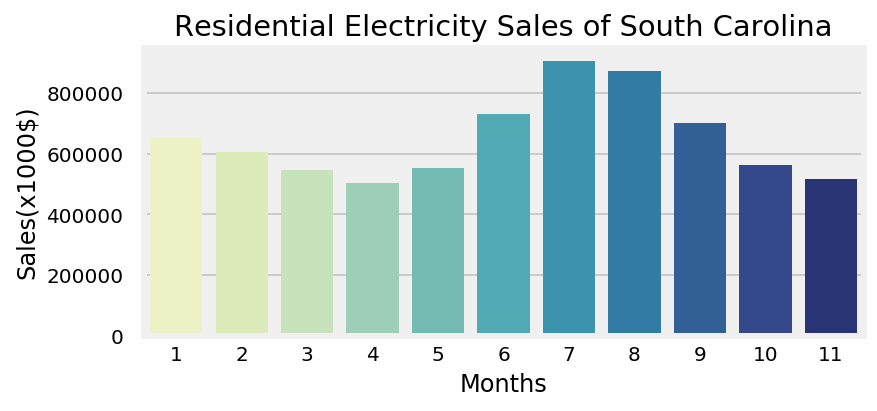

113249.73399999873
103848.54399999978
97306.16200000043
89426.43000000434
79931.55799999852
93294.25799999709
111900.41999999549
111625.84000000302
89065.72600000176
86268.78799999837
90961.83399999987


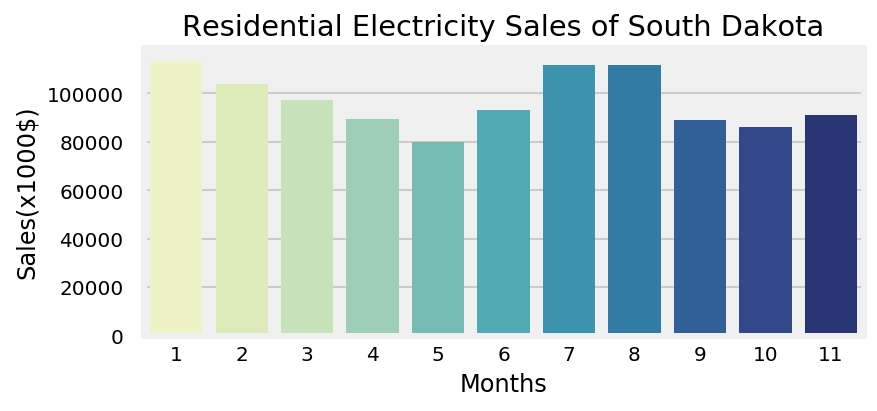

795059.0099999926
787472.3840000163
694281.3840000159
591472.4820000369
599231.1900000392
766817.427999977
983427.4840000377
984218.4499999754
854505.1500000459
608142.5799999807
601512.3380000405


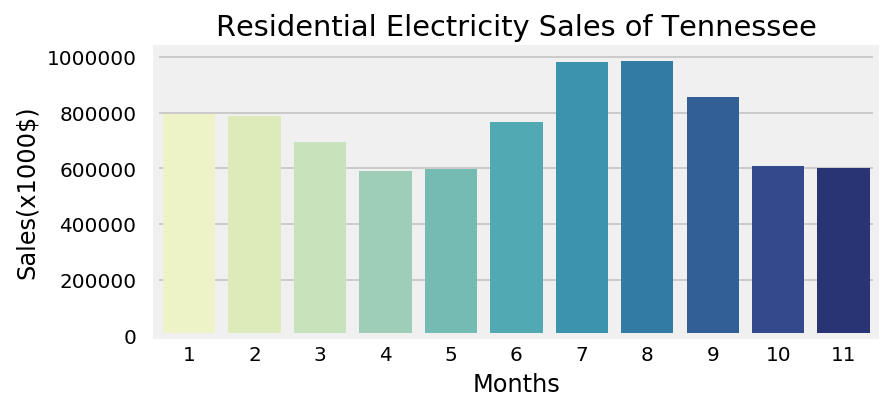

2643219.951999911
2565302.252000223
2405231.3919999953
2383942.738000321
2785831.879999942
3625146.430000246
4397367.759999283
4364859.63999958
3753972.686000551
2808459.604000086
2297071.753999835


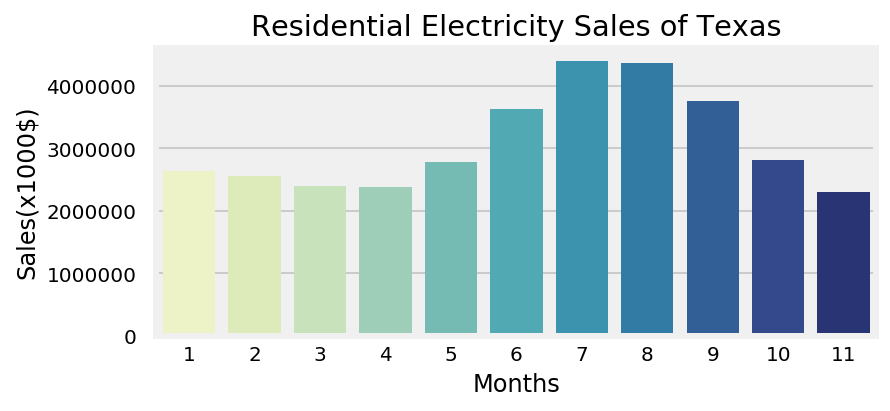

167476.14999999912
152204.00599999804
142571.6060000025
134743.60999999946
156718.969999999
190514.91200000042
268214.6360000053
295267.3339999972
194243.38400000258
152228.61200000223
153302.3020000009


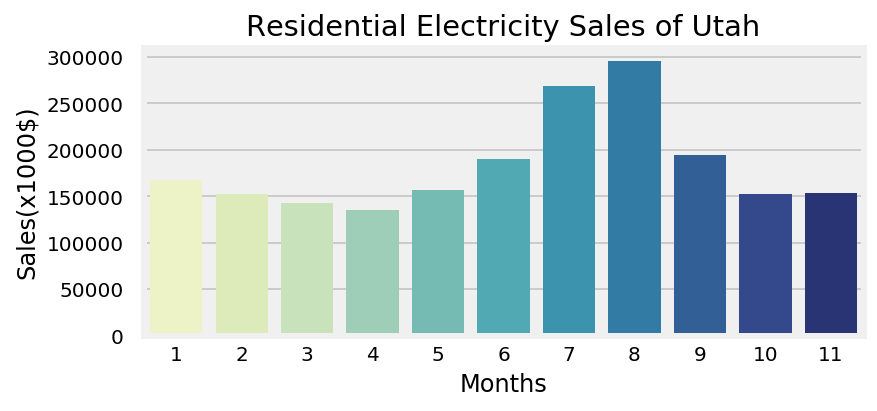

76848.4360000001
72329.47399999967
69042.80200000029
63809.46999999974
61517.48400000021
66831.76599999976
80591.66600000045
73225.7800000004
62019.25400000041
63088.61600000032
66647.33999999987


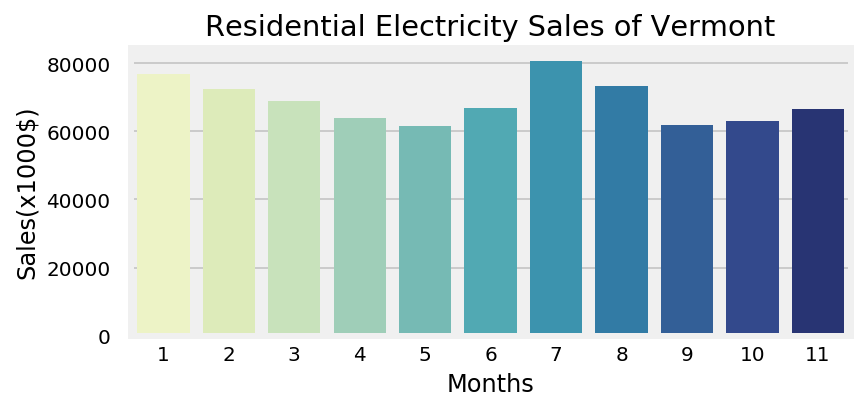

1081197.440000035
903389.633999944
804369.8540000553
712663.2740000221
754965.656000012
1017530.5599999507
1329245.7159999583
1212641.415999982
848161.0260000206
607951.5539999494
759473.8639999784


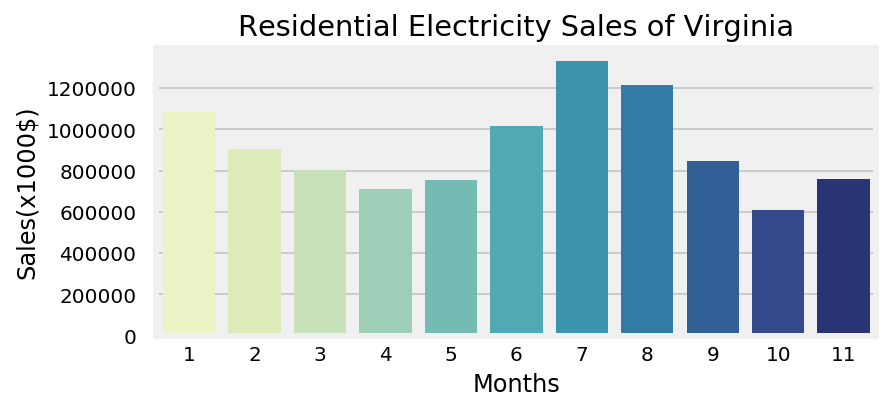

761754.7420000042
677442.2719999943
696589.549999988
572737.944000005
490989.87199998996
495475.2200000149
540720.6239999994
512903.8960000149
475232.5400000077
525163.3719999893
622666.6740000143


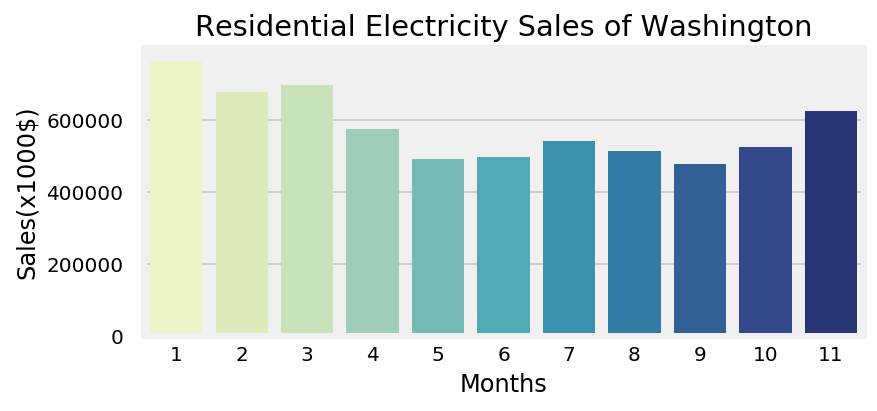

248670.62000000183
237751.99400000155
203879.67799999594
179784.745999997
192696.9139999979
192610.19800000763
254304.40399999812
228002.3100000021
186311.46200000623
171453.1960000019
196476.43599999454


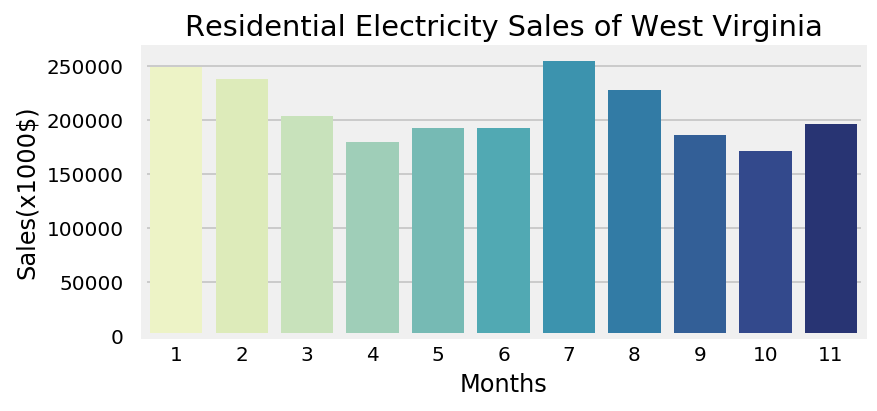

607424.7220000025
532860.7180000218
525640.0019999909
495130.1519999788
502818.6419999828
599291.5999999976
761904.9340000118
648175.8059999947
478067.78400001436
472493.2779999973
523821.41999998613


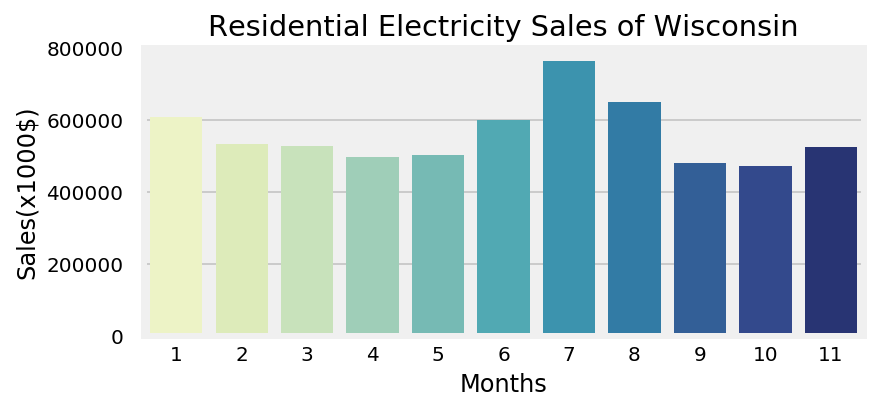

64015.0219999999
60901.64200000008
56906.732000000586
51341.47199999956
43943.311999999736
47329.85399999933
54842.23600000068
53788.92399999984
43857.925999999825
46347.55200000035
51981.49799999996


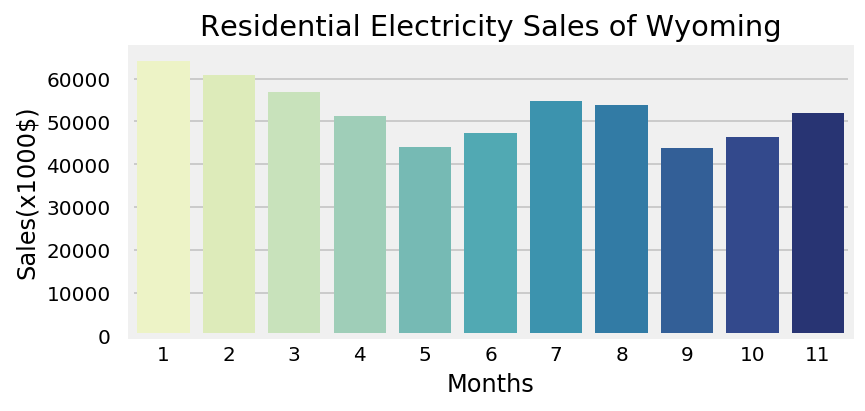

In [361]:
for state in us_resi_elec_sales_df["state"]:
    state_var=us_resi_elec_sales_df[us_resi_elec_sales_df["state"]==state]
    var=[]
    for i in range(1,12):
        for elements in state_var['Electricity_Sales_ Revenue_Residential ($ x1000)'][i]:
            #print(elements)
            var.append(elements)

    fig,ax=plt.subplots(figsize=(5,2))
    ax = fig.add_axes([0,0,1,1])
    sns.barplot(x=month,y=var, palette='YlGnBu')
    # Add padding between axes and labels 
    ax.xaxis.set_tick_params(pad = 5) 
    ax.yaxis.set_tick_params(pad = 10) 

    ax.set_xlabel('Months')
    ax.set_ylabel('Sales(x1000$)')
    ax.set_title('Residential Electricity Sales of {}'.format(state))
    #plt.plot(var)
    plt.show()


In [101]:
us_comm_elec_sales_df=df.pivot_table( index=["state"], columns='month', values=['Electricity_Sales_ Revenue_Commercial ($ x1000)'])
us_comm_elec_sales_df.reset_index(inplace=True)
us_comm_elec_sales_df.head()

state Electricity_Sales_ Revenue_Commercial ($ x1000)  \
month                                                           1   
0         Alabama                                      398194.878   
1          Alaska                                       99062.050   
2         Arizona                                      403362.296   
3        Arkansas                                      142370.550   
4      California                                     2766808.332   

                                                                        \
month            2            3            4            5            6   
0       373683.348   372005.764   330800.336   363713.300   438687.868   
1        93495.978    90312.928    79027.194    75345.306    76535.518   
2       381302.224   392527.600   397326.484   528307.754   583874.998   
3       146793.340   143605.130   135836.004   134710.054   169140.932   
4      2415591.152  2751725.610  2354437.606  2519021.048  3426502.286   

                                                                        
month            7            8            9           10           11  
0       491791.278   494951.746   453344.178   411483.746   368638.970  
1        79967.618    80214.044    79099.968    79126.114    85204.778  
2       684988.016   678360.736   595893.676   489004.266   402278.128  
3       194318.040   191581.240   179419.550   168346.256   143588.876  
4      4199746.278  3768645.422  3789834.580  3704774.510  2580709.310

In [ ]:
#sns palette options: Accent, Accent_r, Blues, Blues_r, BrBG, BrBG_r, BuGn, BuGn_r, BuPu, BuPu_r, CMRmap, CMRmap_r, Dark2, Dark2_r, GnBu, GnBu_r, Greens, Greens_r, Greys, Greys_r, OrRd, OrRd_r, Oranges, Oranges_r, PRGn, PRGn_r, Paired, Paired_r, Pastel1, Pastel1_r, Pastel2, Pastel2_r, PiYG, PiYG_r, PuBu, PuBuGn, PuBuGn_r, PuBu_r, PuOr, PuOr_r, PuRd, PuRd_r, Purples, Purples_r, RdBu, RdBu_r, RdGy, RdGy_r, RdPu, RdPu_r, RdYlBu, RdYlBu_r, RdYlGn, RdYlGn_r, Reds, Reds_r, Set1, Set1_r, Set2, Set2_r, Set3, Set3_r, Spectral, Spectral_r, Wistia, Wistia_r, YlGn, YlGnBu, YlGnBu_r, YlGn_r, YlOrBr, YlOrBr_r, YlOrRd, YlOrRd_r, afmhot, afmhot_r, autumn, autumn_r, binary, binary_r, bone, bone_r, brg, brg_r, bwr, bwr_r, cividis, cividis_r, cool, cool_r, coolwarm, coolwarm_r, copper, copper_r, cubehelix, cubehelix_r, flag, flag_r, gist_earth, gist_earth_r, gist_gray, gist_gray_r, gist_heat, gist_heat_r, gist_ncar, gist_ncar_r, gist_rainbow, gist_rainbow_r, gist_stern, gist_stern_r, gist_yarg, gist_yarg_r, gnuplot, gnuplot2, gnuplot2_r, gnuplot_r, gray, gray_r, hot, hot_r, hsv, hsv_r, icefire, icefire_r, inferno, inferno_r, jet, jet_r, magma, magma_r, mako, mako_r, nipy_spectral, nipy_spectral_r, ocean, ocean_r, pink, pink_r, plasma, plasma_r, prism, prism_r, rainbow, rainbow_r, rocket, rocket_r, seismic, seismic_r, spring, spring_r, summer, summer_r, tab10, tab10_r, tab20, tab20_r, tab20b, tab20b_r, tab20c, tab20c_r, terrain, terrain_r, twilight, twilight_r, twilight_shifted, twilight_shifted_r, viridis, viridis_r, vlag, vlag_r, winter, winter_r

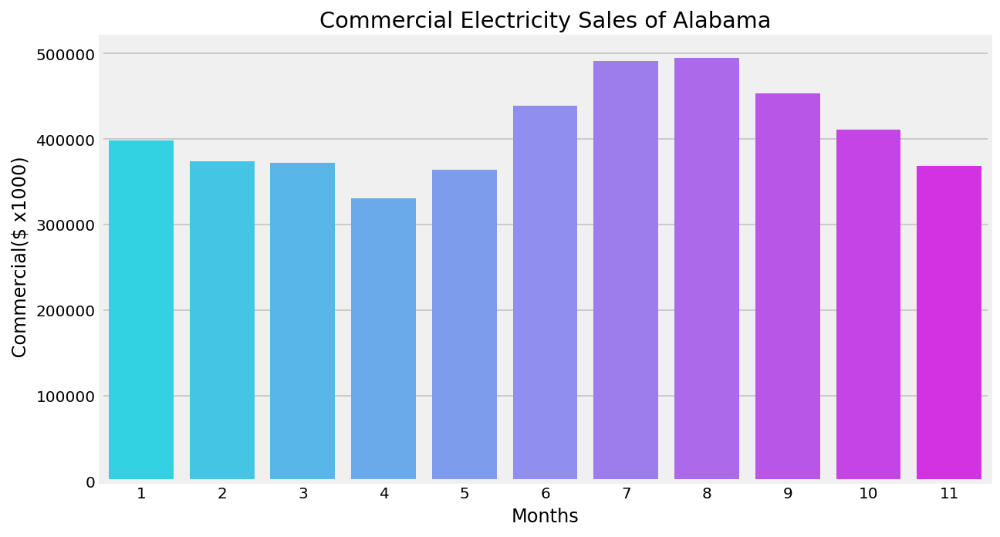

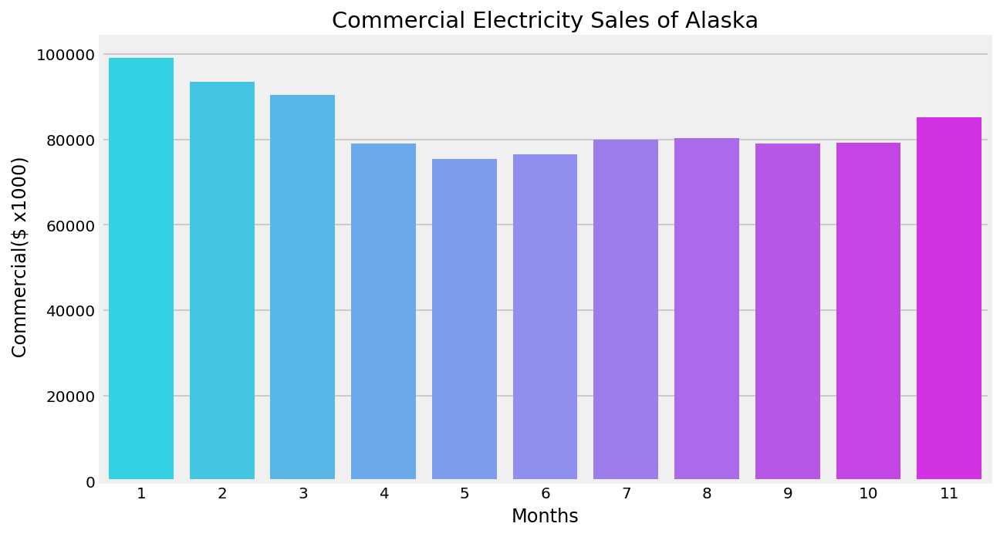

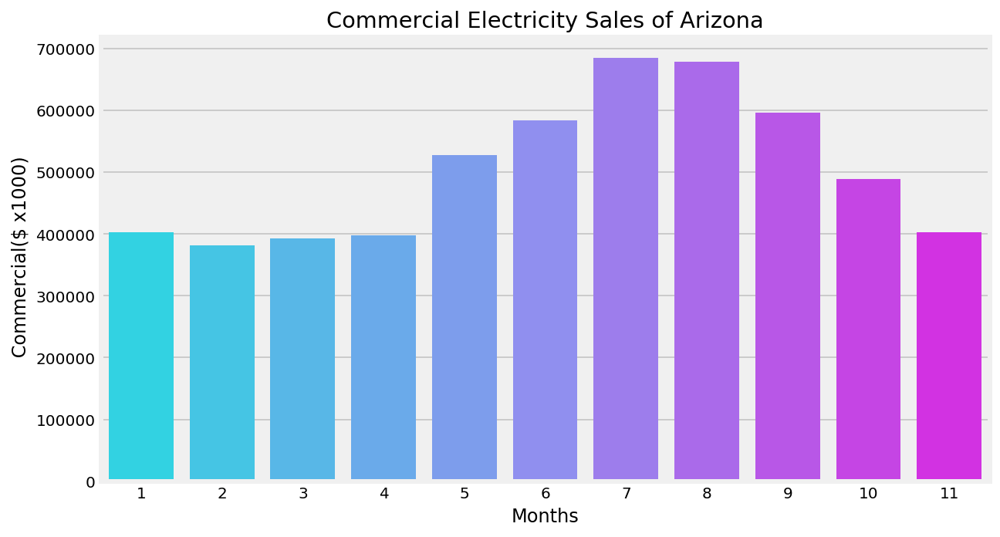

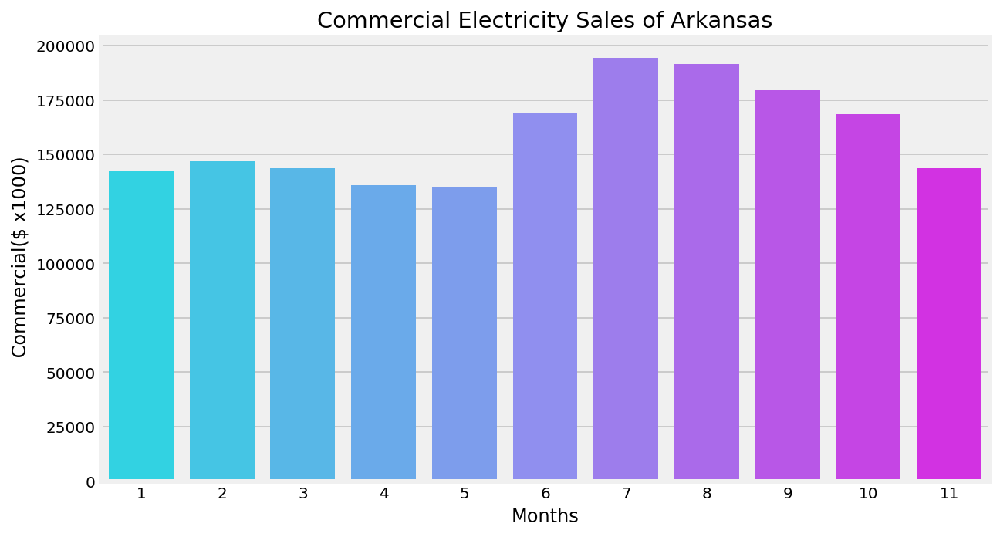

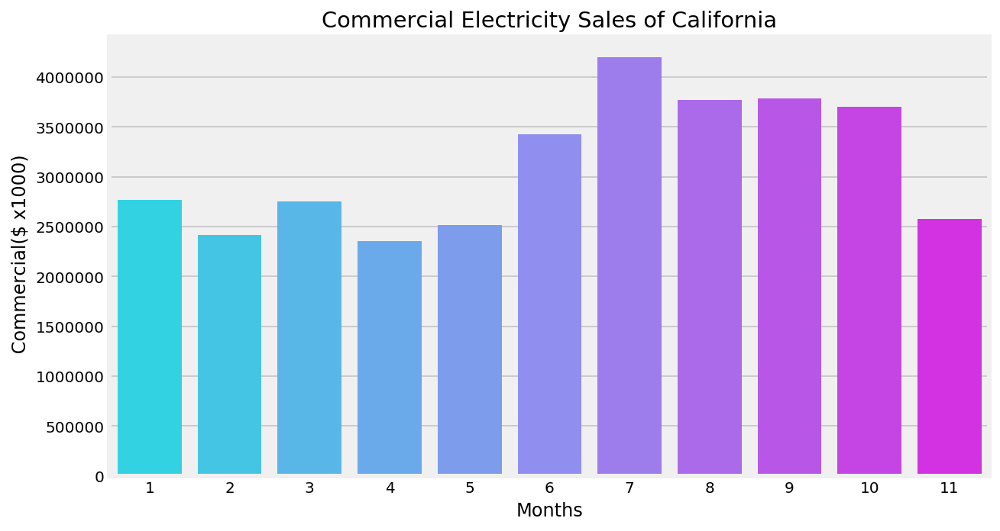

...

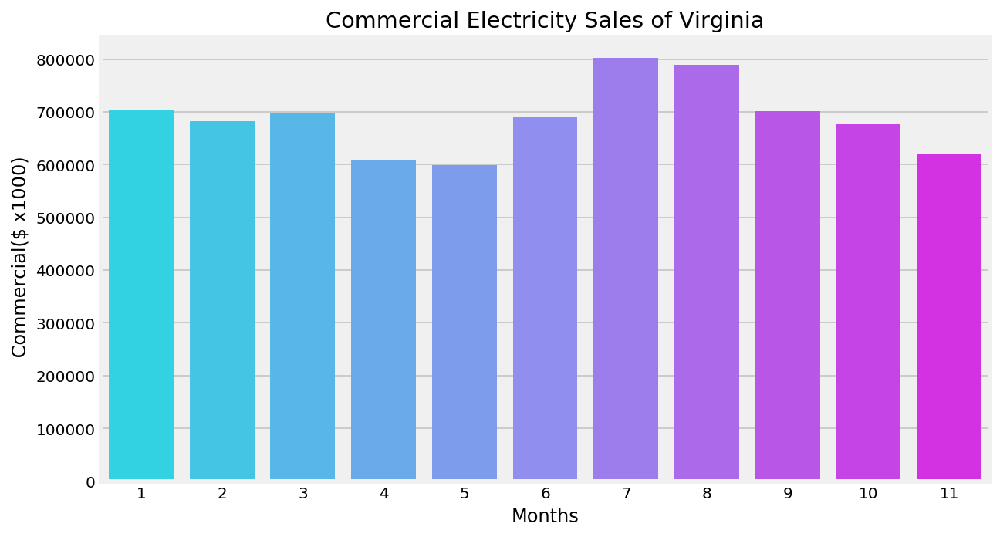

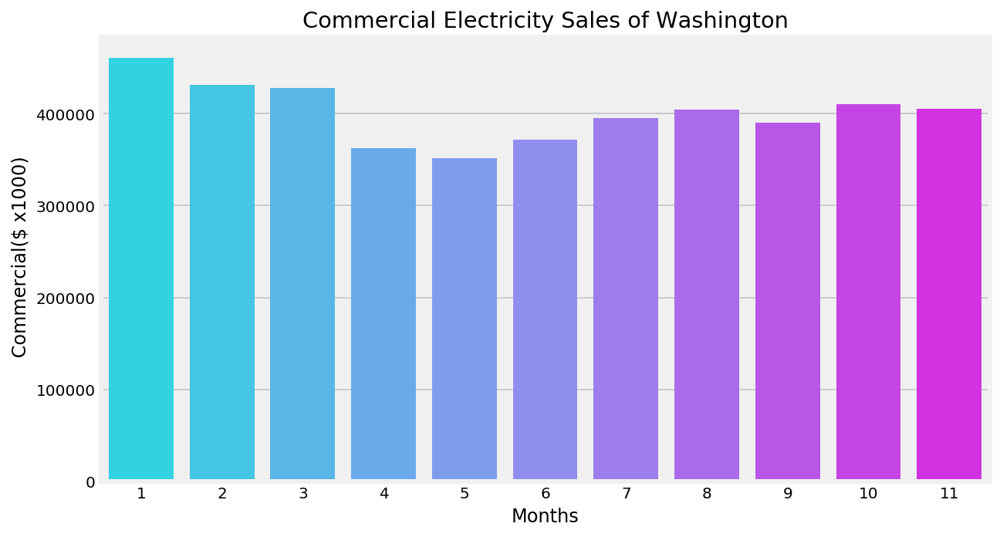

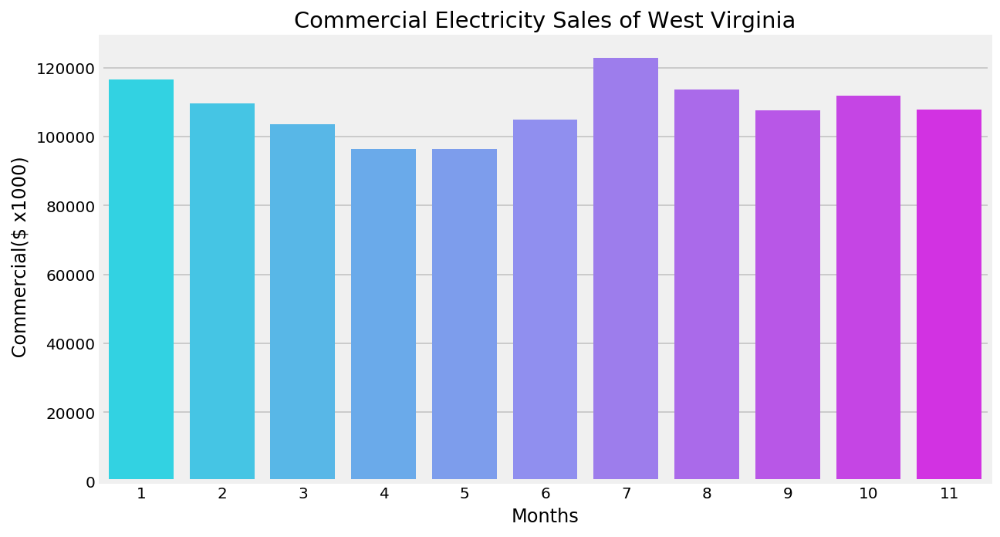

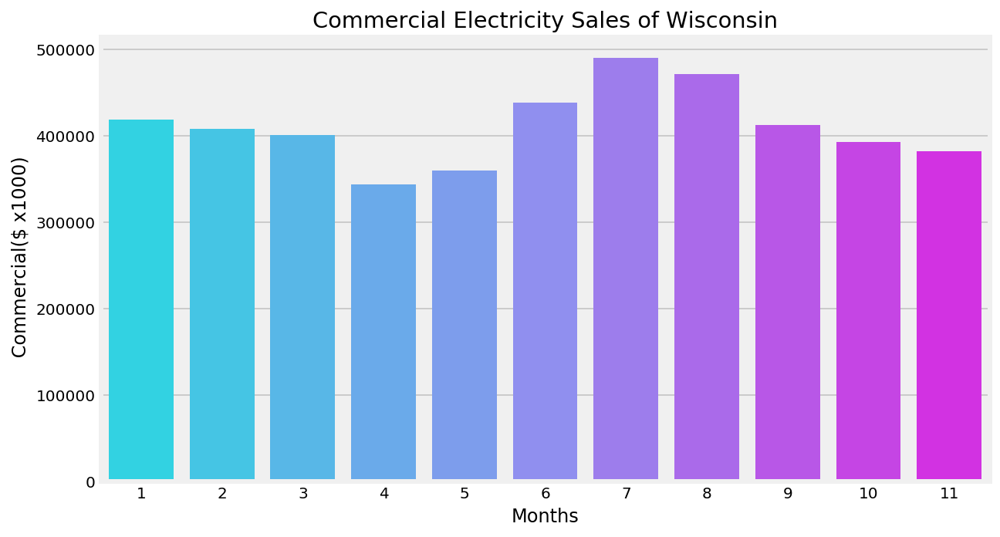

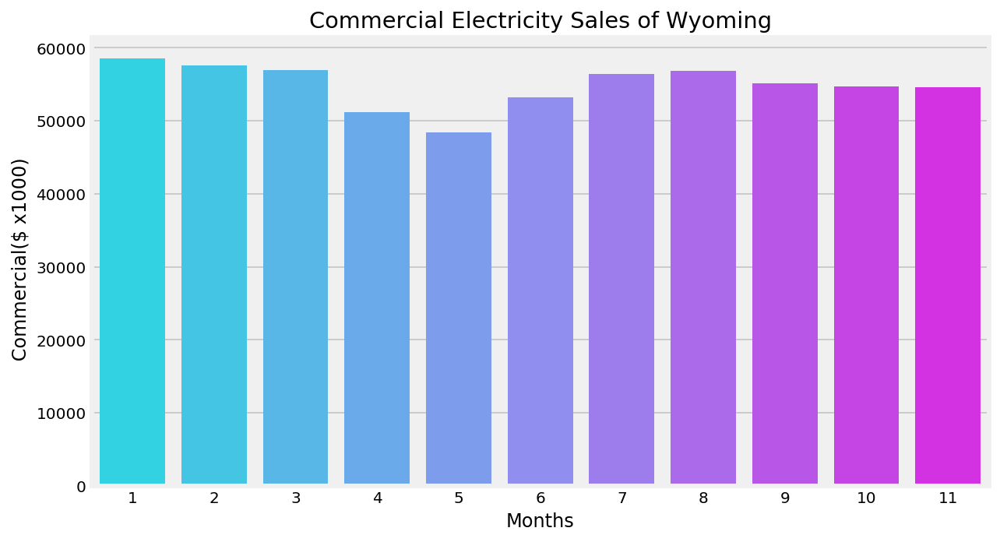

In [207]:
for state in us_comm_elec_sales_df["state"]:
    state_var=us_comm_elec_sales_df[us_comm_elec_sales_df["state"]==state]
    var=[]
    for i in range(1,12):
        for elements in state_var['Electricity_Sales_ Revenue_Commercial ($ x1000)'][i]:
            #print(elements)
            var.append(elements)

    fig=plt.figure(figsize=(8,4))
    ax = fig.add_axes([0,0,1,1])
    sns.barplot(x= month, y =var, palette= 'cool')
    #ax.bar(month,var)
    ax.set_xlabel('Months')
    ax.set_ylabel(' Commercial($ x1000)')
    ax.set_title('Commercial Electricity Sales of {}'.format(state))
    #plt.plot(var)
    plt.show()

In [105]:
us_indus_elec_sales_df=df.pivot_table( index=["state"], columns='month', values=['Electricity_Sales_ Revenue_Industrial ($ x1000)'])
us_indus_elec_sales_df.reset_index(inplace=True)
us_indus_elec_sales_df.head()

state Electricity_Sales_ Revenue_Industrial ($ x1000)              \
month                                                           1           2   
0         Alabama                                      309206.548  285608.768   
1          Alaska                                       41003.786   35280.944   
2         Arizona                                      119389.784  114450.500   
3        Arkansas                                      133942.134  151008.486   
4      California                                      825181.724  829326.474   

                                                                      \
month           3           4            5            6            7   
0      283840.044  266112.932   280715.062   302202.890   325405.686   
1       36509.470   29117.876    30743.634    35210.248    37939.530   
2      109847.984  120112.086   144773.332   145647.784   177146.542   
3      147200.176  138420.680   140758.710   160145.954   181522.800   
4      910362.864  804627.672  1024675.956  1373264.268  1557468.504   

                                                           
month            8            9           10           11  
0       342044.470   313449.018   309029.198   308806.784  
1        40179.300    35406.456    35138.520    34066.180  
2       200251.208   148241.078   146851.982   126531.022  
3       189278.348   178054.078   167868.512   154468.814  
4      1494878.552  1426052.560  1321592.280  1034847.388

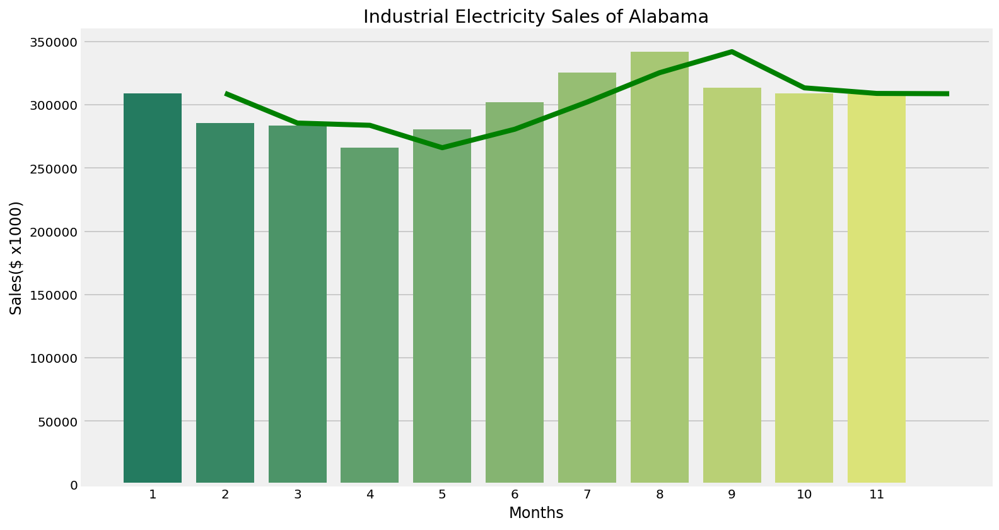

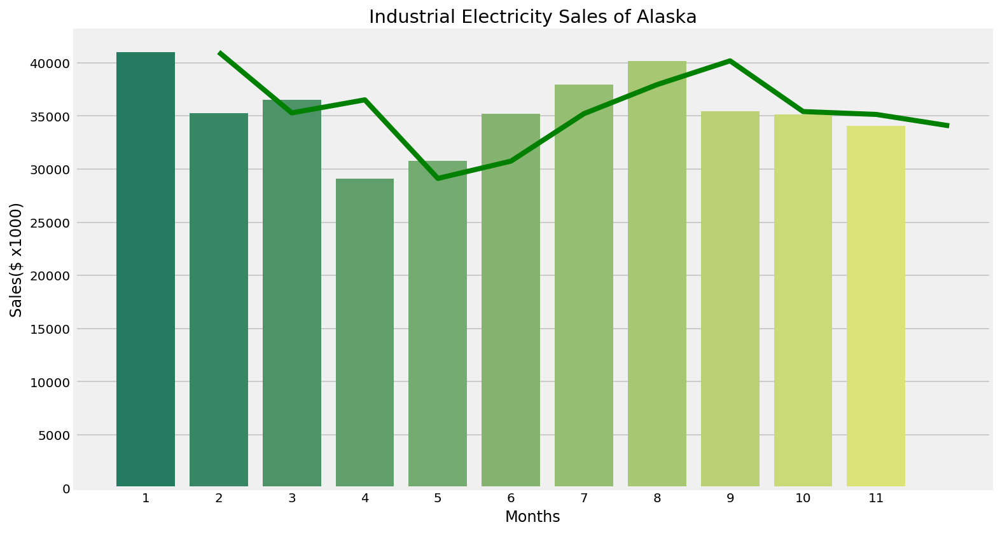

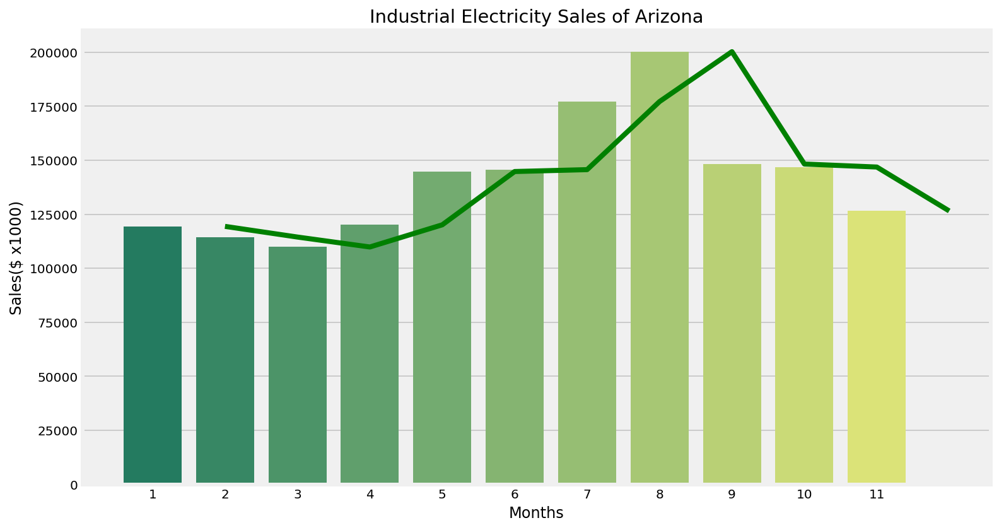

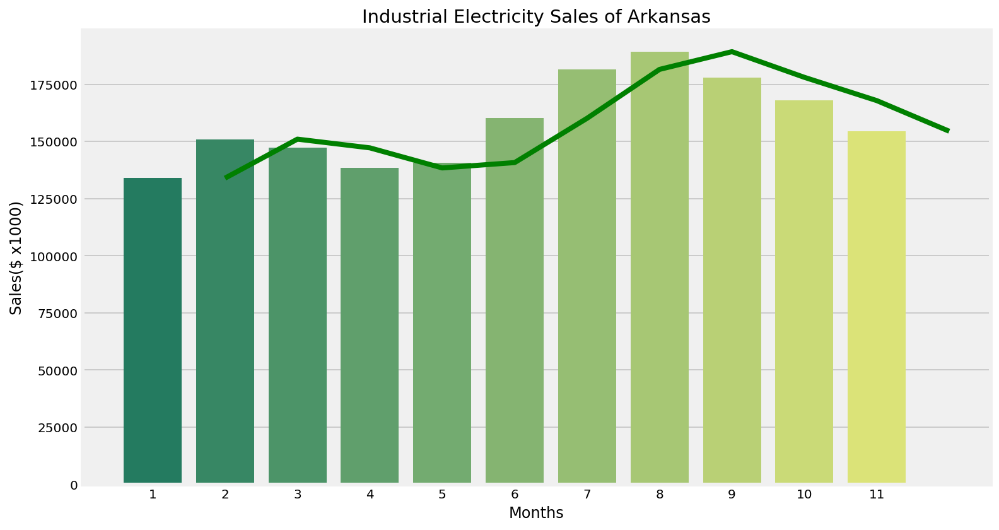

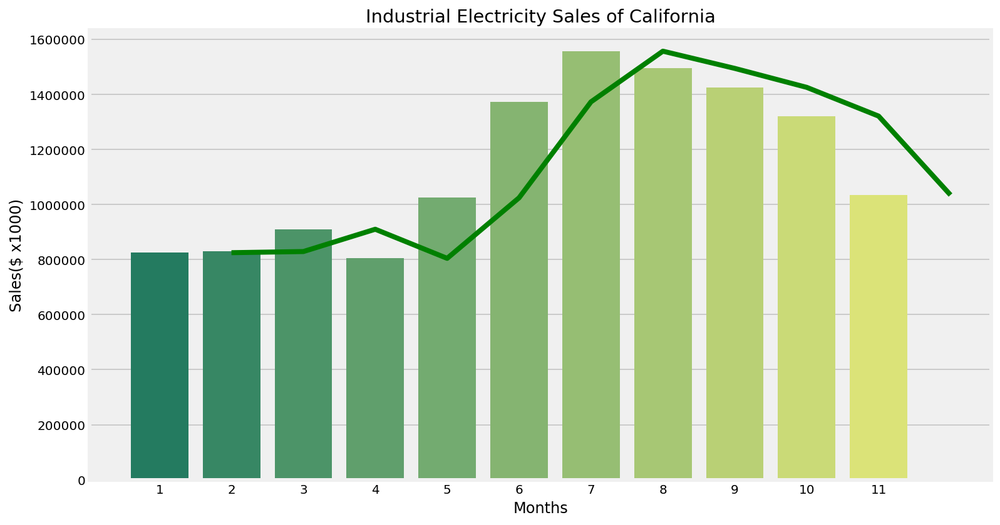

...

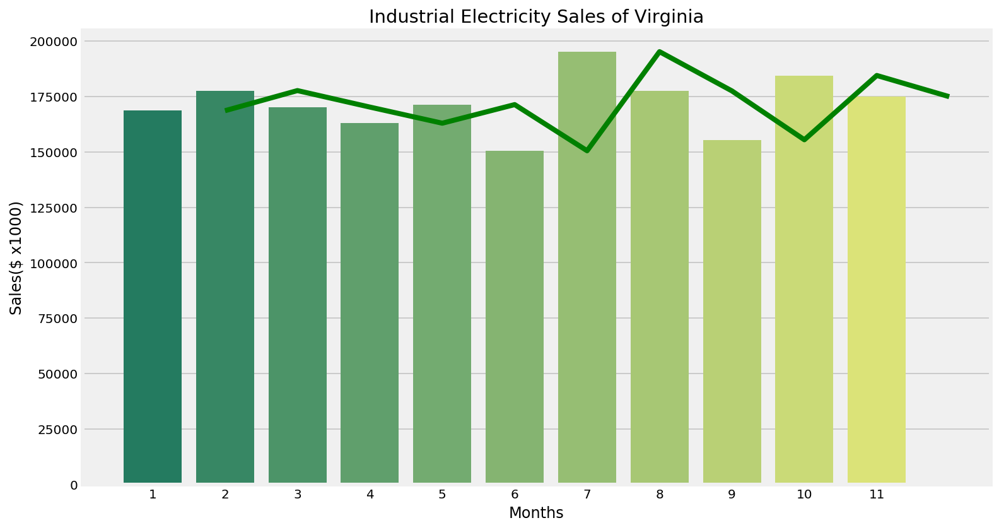

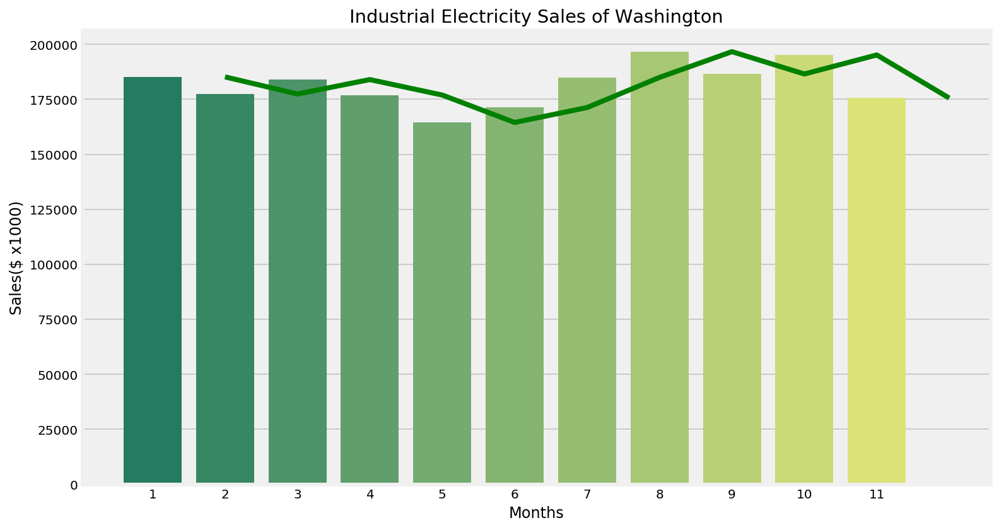

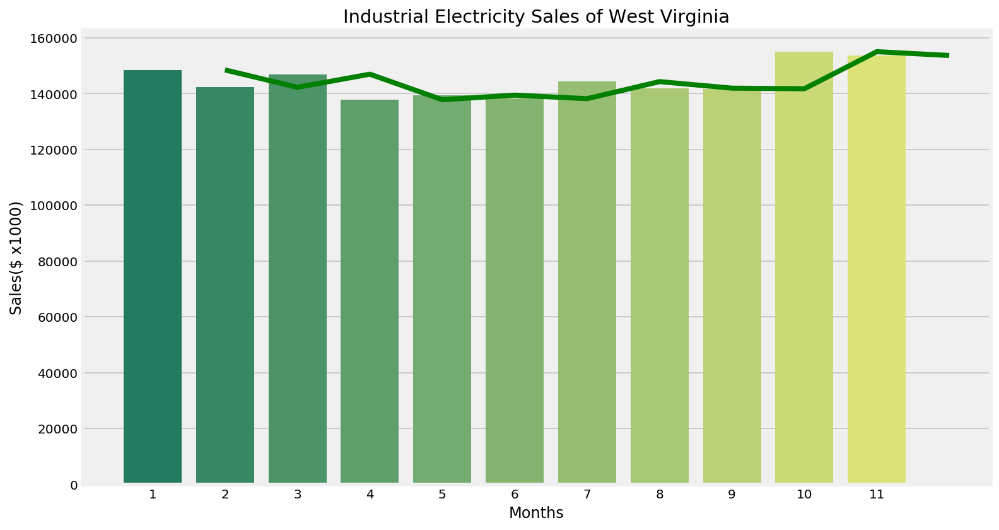

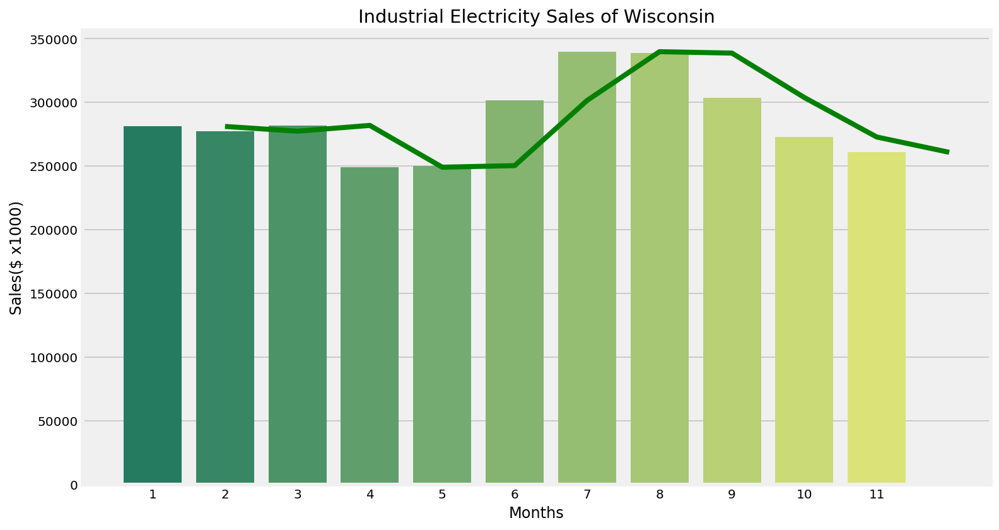

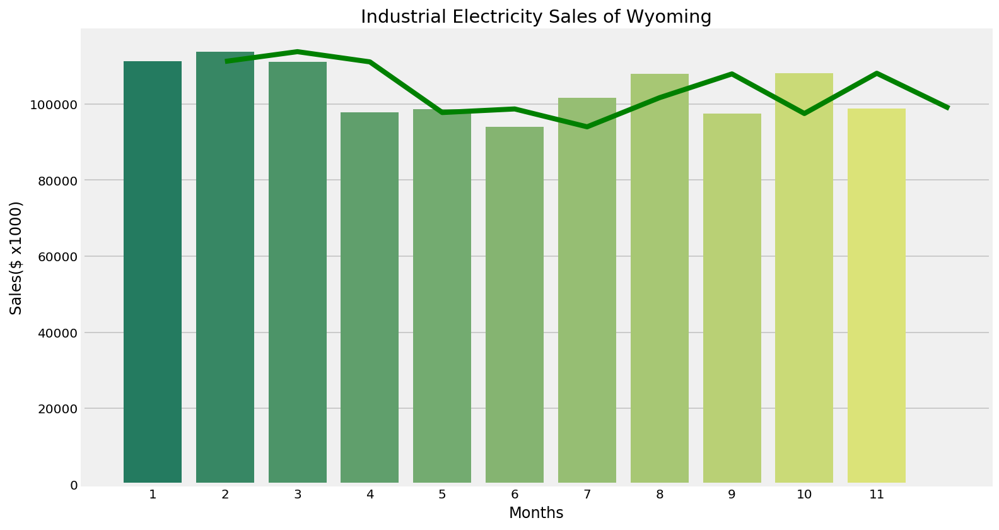

In [183]:
for state in us_indus_elec_sales_df["state"]:
    state_var=us_indus_elec_sales_df[us_indus_elec_sales_df["state"]==state]
    var=[]
    for i in range(1,12):
        for elements in state_var['Electricity_Sales_ Revenue_Industrial ($ x1000)'][i]:
            #print(elements)
            var.append(elements)

    fig=plt.figure(figsize=(10,5))
    ax = fig.add_axes([0,0,1,1])
    sns.barplot(x= month, y =var, palette= 'summer')
    #ax.bar(month,var, color='blue')
    #ax.plot(month,var, color='green')
    ax.set_xlabel('Months')
    ax.set_ylabel('Sales($ x1000)')
    ax.set_title('Industrial Electricity Sales of {}'.format(state))
    #plt.plot(var)
    plt.show()

In [162]:
poverty_df=df.pivot_table(index= 'countyFIPS', values= ["C_PCTPOVALL_2019", "C_PCTPOV017_2019", "C_PCTPOV517_2019"])
poverty_df.reset_index(inplace=True)

In [172]:
poverty_df.rename(columns={'C_PCTPOVALL_2019': 'Poverty% 2019(all ages)', 'C_PCTPOV017_2019':'Poverty% 2019(0-17)', 
                          "C_PCTPOV517_2019":"Poverty% 2019(Families of chilren(5-17))"})

,countyFIPS,Poverty% 2019(0-17),Poverty% 2019(Families of chilren(5-17)),Poverty% 2019(all ages)
0,1001,15.9,14.4,12.1
1,1003,13.5,13.3,10.1
2,1005,41.0,39.5,27.1
3,1007,25.9,25.2,20.3
4,1009,21.0,21.4,16.3
5,1011,39.9,39.0,30.0
6,1013,34.6,32.8,21.6
7,1015,24.6,22.8,17.2
8,1017,30.4,31.1,19.6
9,1019,23.3,21.6,15.9


In [173]:
poverty_df.style.background_gradient(cmap='Oranges')

In [180]:
Demographics_df1=df.pivot_table(index='state', values=['C_TOT_POP', 'C_TOT_MALE','C_TOT_FEMALE'], aggfunc='sum')
Demographics_df1.reset_index(inplace= True)
Demographics_df1.head()

,state,C_TOT_FEMALE,C_TOT_MALE,C_TOT_POP
0,Alabama,9.312998e+08,8.769589e+08,1.808259e+09
1,Alaska,1.286730e+08,1.399631e+08,2.686361e+08
2,Arizona,1.235540e+09,1.221931e+09,2.457471e+09
3,Arkansas,5.627404e+08,5.431838e+08,1.105924e+09
4,California,7.171075e+09,7.094462e+09,1.426554e+10


In [219]:
states=df['stateFIPS'].unique()

In [228]:
Demographics_df1.shape

(51, 4)

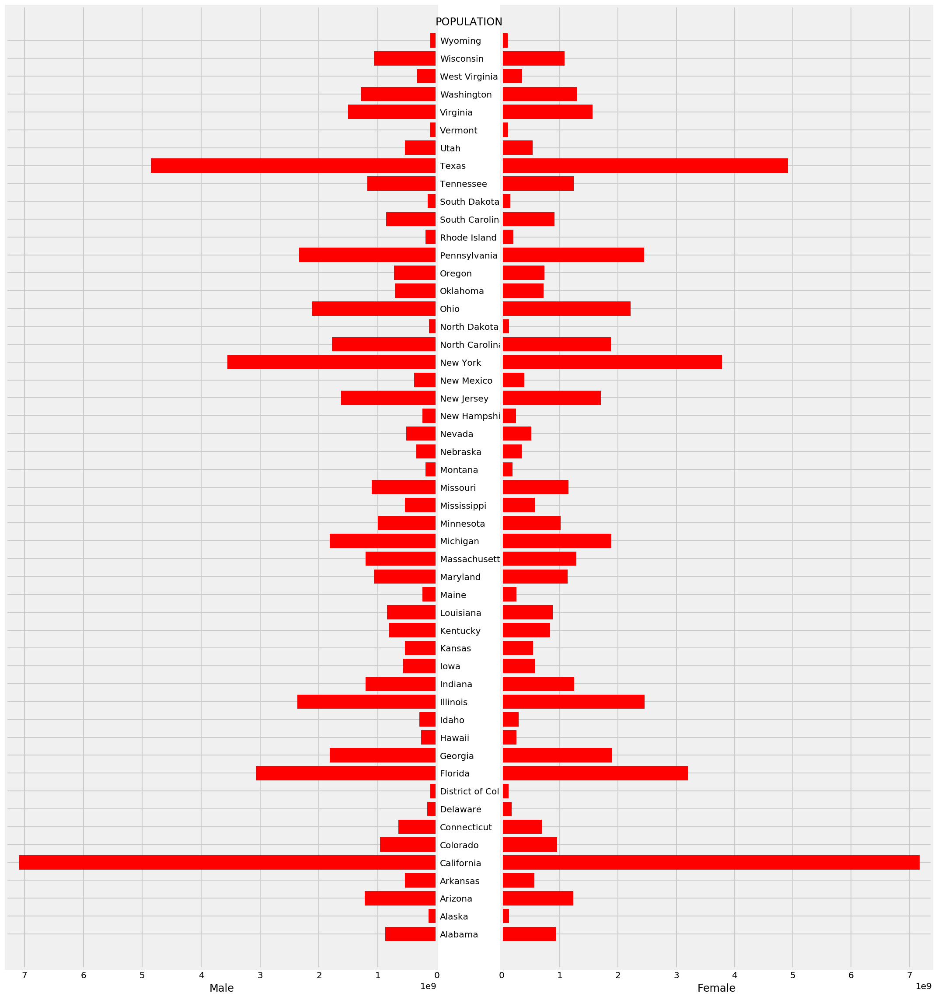

In [262]:
fig,ax=plt.subplots(ncols=2, sharey=True, figsize=(15,16))
ax[0].barh(Demographics_df1["state"], Demographics_df1["C_TOT_MALE"], align='center', color='red')
ax[0].set(xlabel="Male")
ax[1].barh(Demographics_df1["state"], Demographics_df1["C_TOT_FEMALE"], align='center', color='red')
ax[1].set(xlabel="Female")
ax[0].invert_xaxis()

#ax[0].set(yticks=states, yticklabels=states)
ax[0].yaxis.tick_right()
for axes in ax.flat:
    axes.margins(0.03)
    axes.grid(True)
fig.suptitle('POPULATION')
fig.tight_layout()
fig.subplots_adjust(wspace=0.15)
plt.show()


In [264]:
Demographics_df2=df.pivot_table(index='state', values=['C_MinorityPCT','C_BlackPCT','C_HispanicPCT'], aggfunc='mean')
Demographics_df2.reset_index(inplace=True)
Demographics_df2.head()

,state,C_BlackPCT,C_HispanicPCT,C_MinorityPCT
0,Alabama,0.285224,0.034122,0.342606
1,Alaska,0.017083,0.044242,0.529725
2,Arizona,0.022667,0.301573,0.478733
3,Arkansas,0.160533,0.048829,0.236176
4,California,0.035345,0.291812,0.437743


In [299]:
Demographics_df2['C_WhitePCT']=1-Demographics_df2['C_MinorityPCT']
Demographics_df2['Others']=1-(Demographics_df2['C_WhitePCT']+Demographics_df2['C_BlackPCT']+Demographics_df2['C_HispanicPCT'])


In [306]:
Demographics_df2.drop(['C_MinorityPCT'],axis=1)


,state,C_BlackPCT,C_HispanicPCT,C_WhitePCT,Others
0,Alabama,0.285224,0.034122,0.657394,0.023260
1,Alaska,0.017083,0.044242,0.470275,0.468400
2,Arizona,0.022667,0.301573,0.521267,0.154493
3,Arkansas,0.160533,0.048829,0.763824,0.026813
4,California,0.035345,0.291812,0.562257,0.110586
5,Colorado,0.016825,0.194662,0.756992,0.031521
6,Connecticut,0.075000,0.104938,0.778200,0.041862
7,Delaware,0.210000,0.081833,0.667067,0.041100
8,District of Columbia,0.500000,0.099200,0.354800,0.046000
9,Florida,0.148333,0.122706,0.699320,0.029641


In [307]:
Demographics_df2.head()

,state,C_BlackPCT,C_HispanicPCT,C_MinorityPCT,C_WhitePCT,Others
0,Alabama,0.285224,0.034122,0.342606,0.657394,0.023260
1,Alaska,0.017083,0.044242,0.529725,0.470275,0.468400
2,Arizona,0.022667,0.301573,0.478733,0.521267,0.154493
3,Arkansas,0.160533,0.048829,0.236176,0.763824,0.026813
4,California,0.035345,0.291812,0.437743,0.562257,0.110586


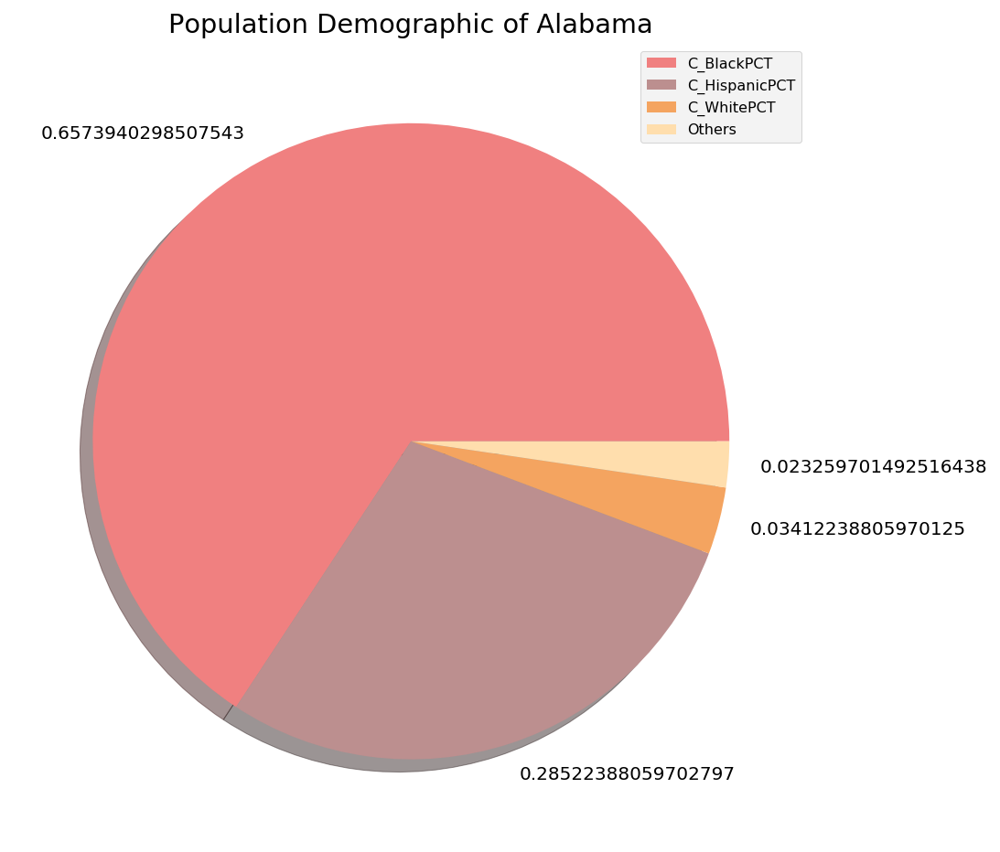

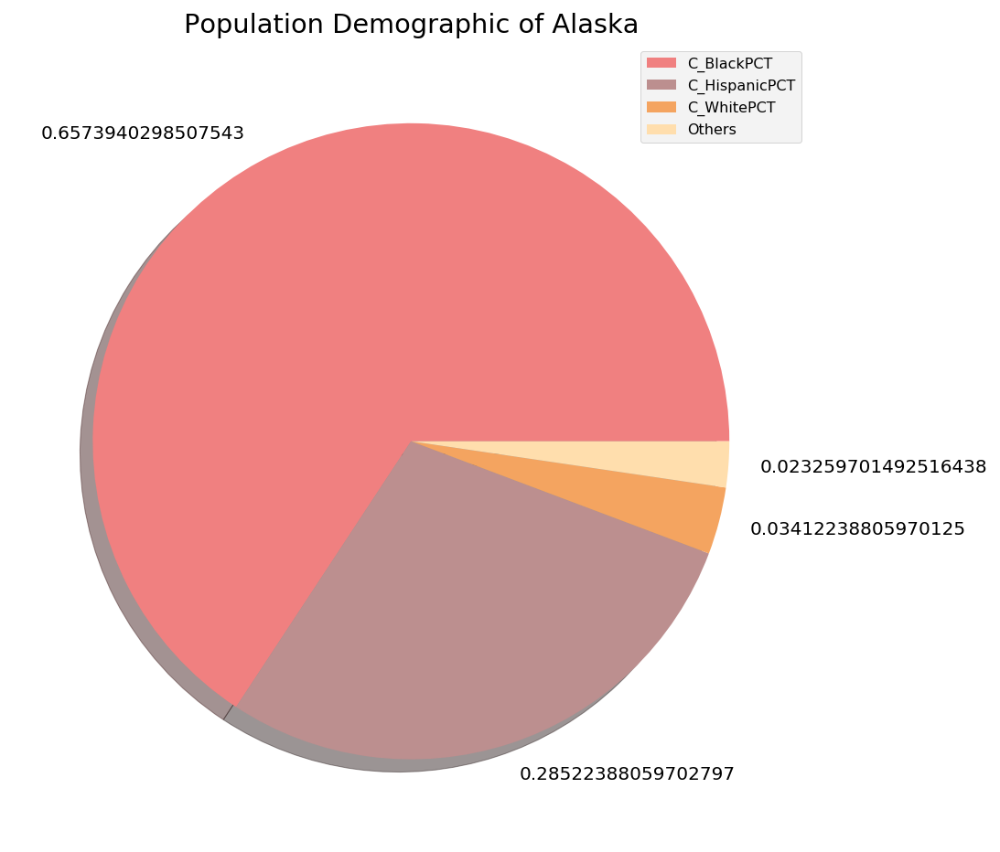

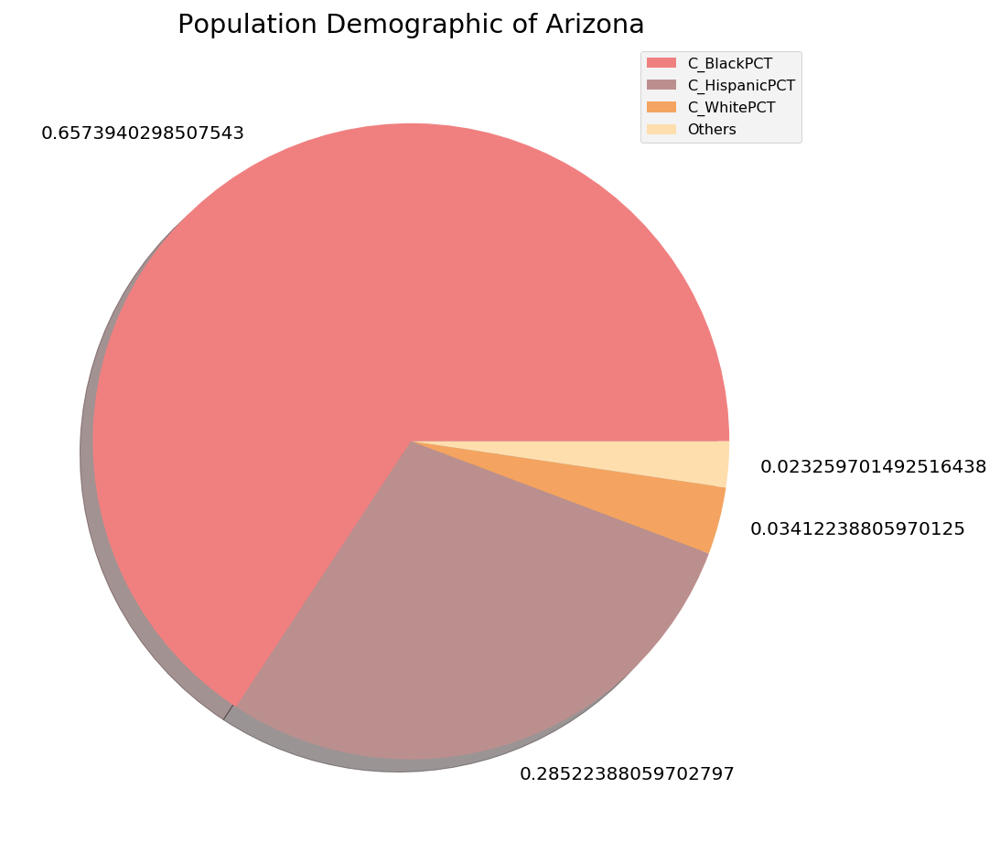

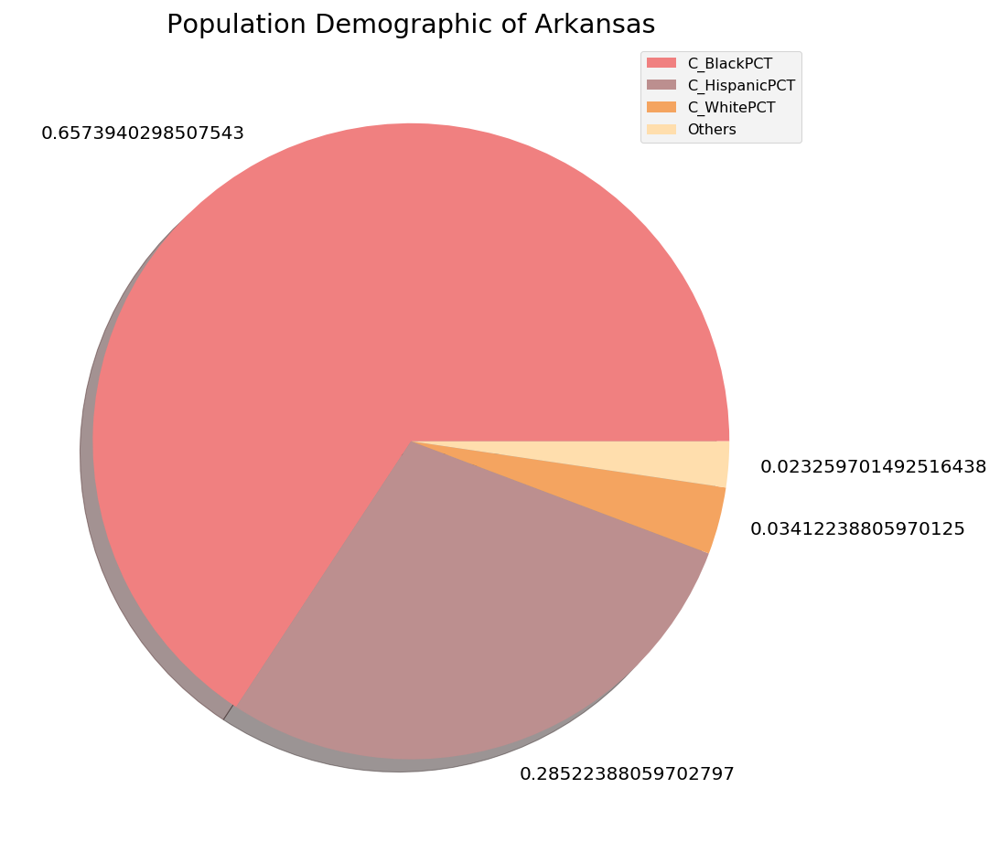

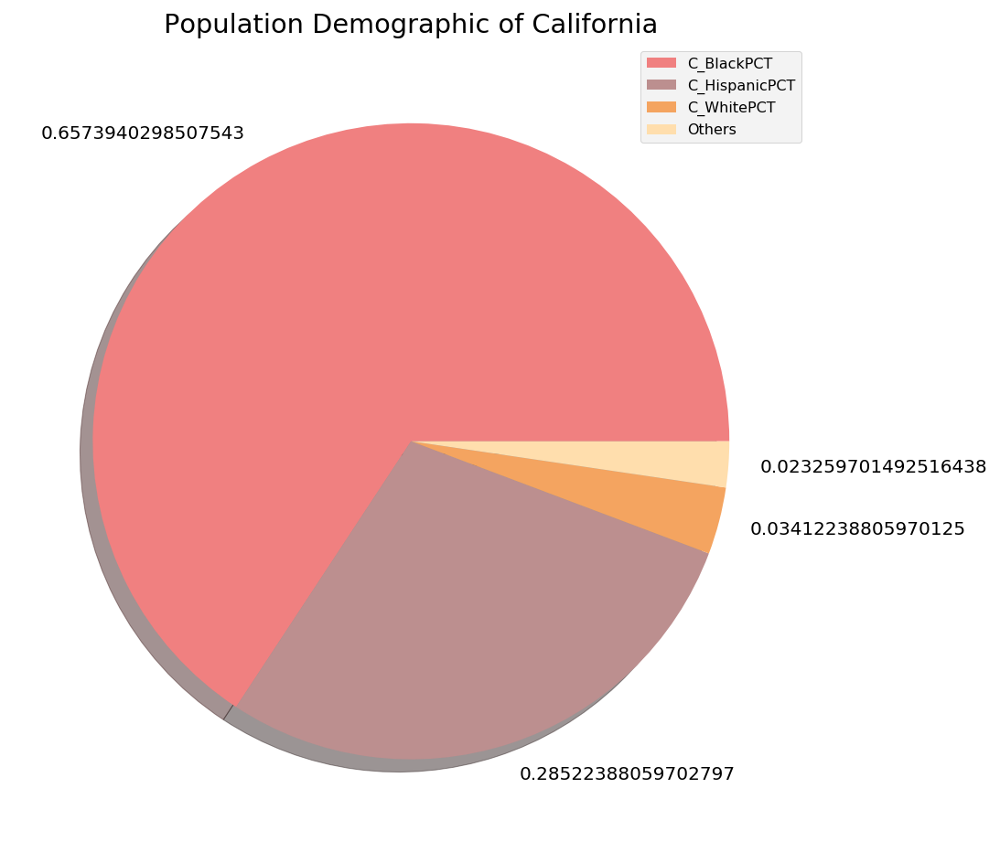

...

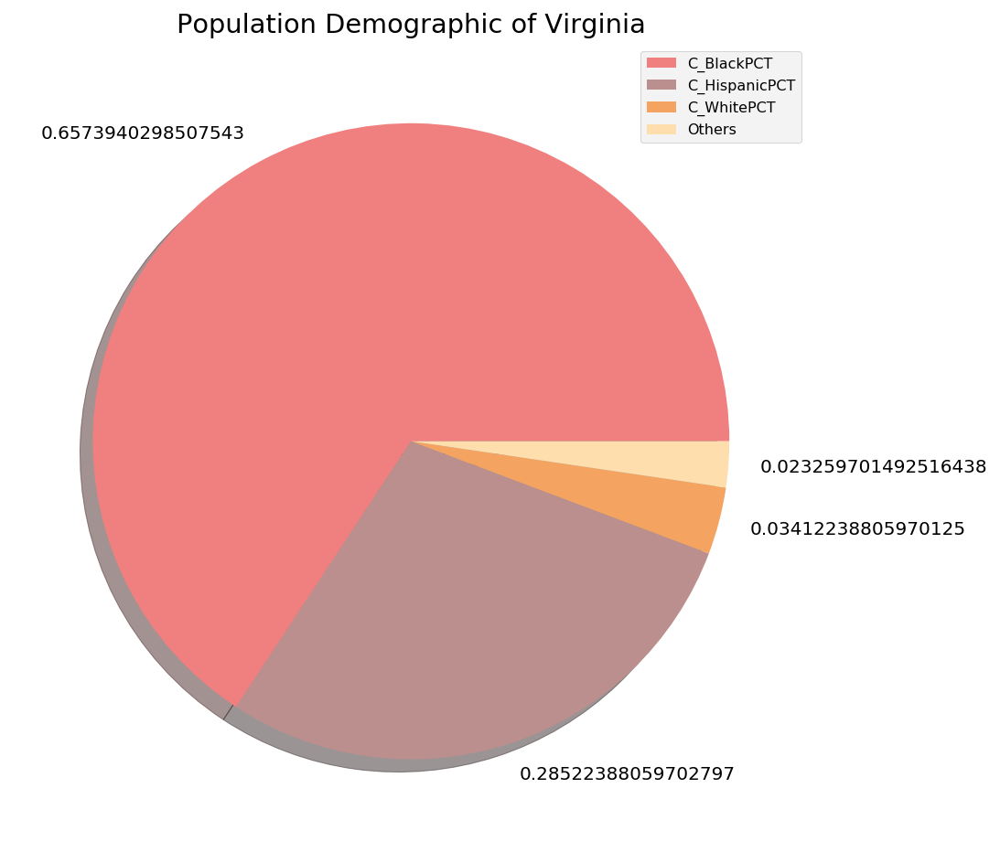

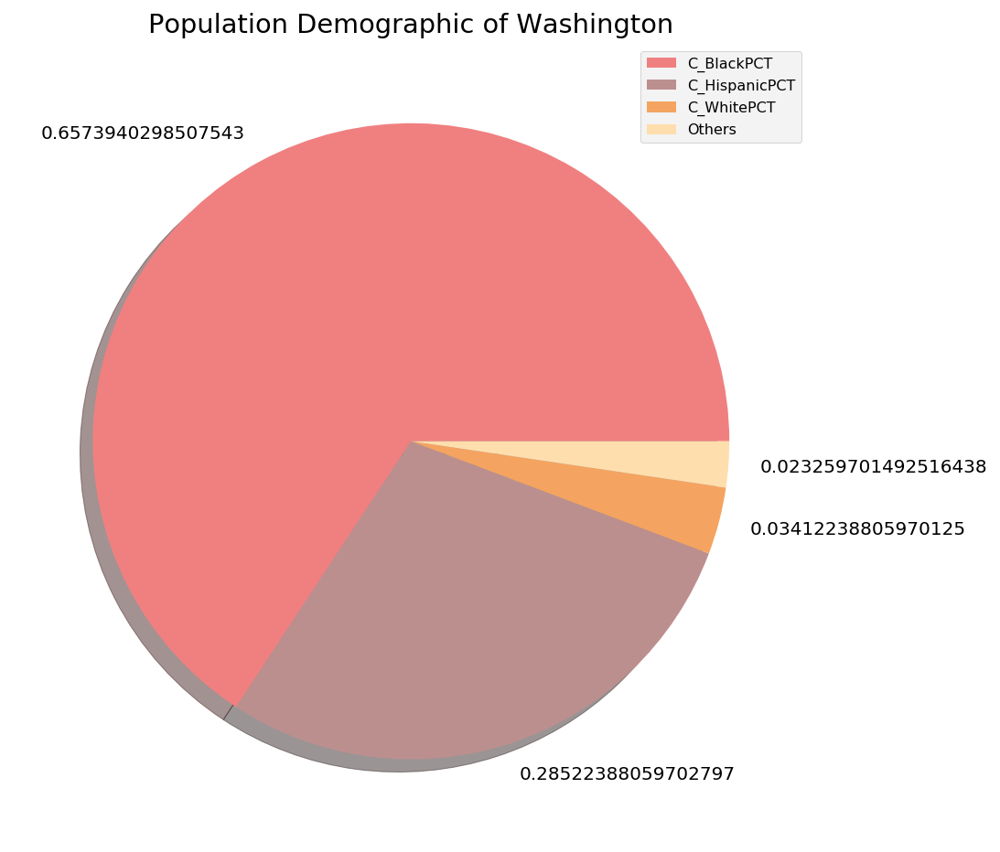

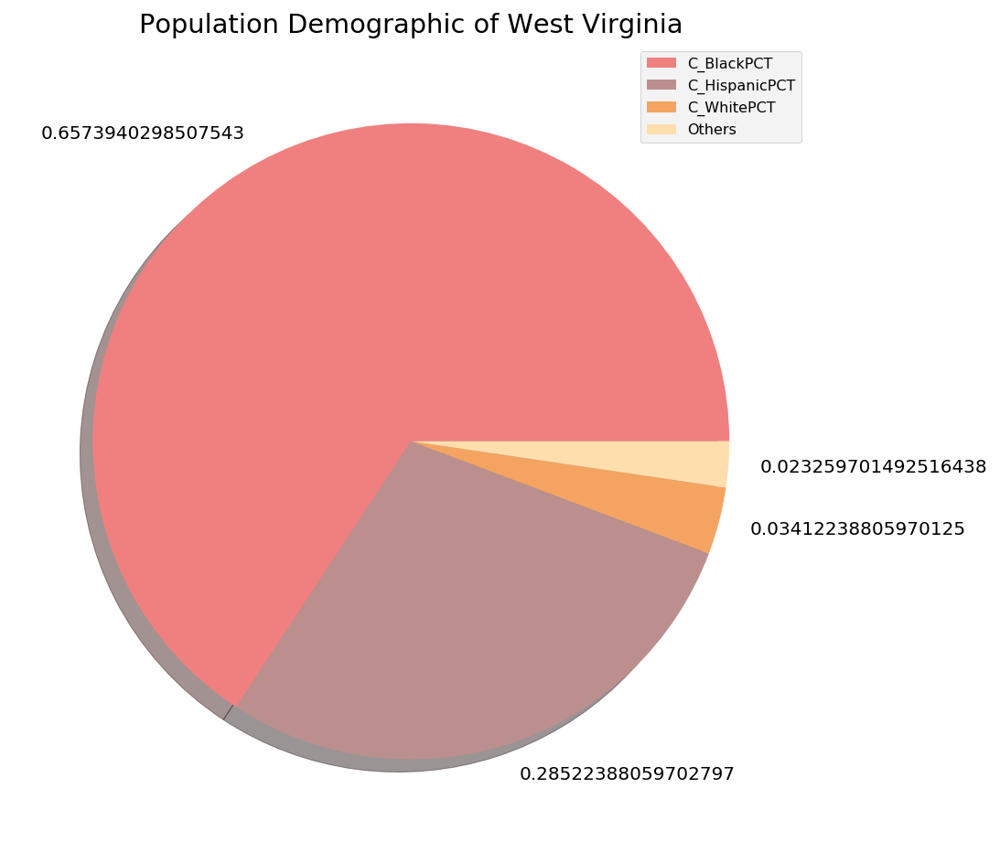

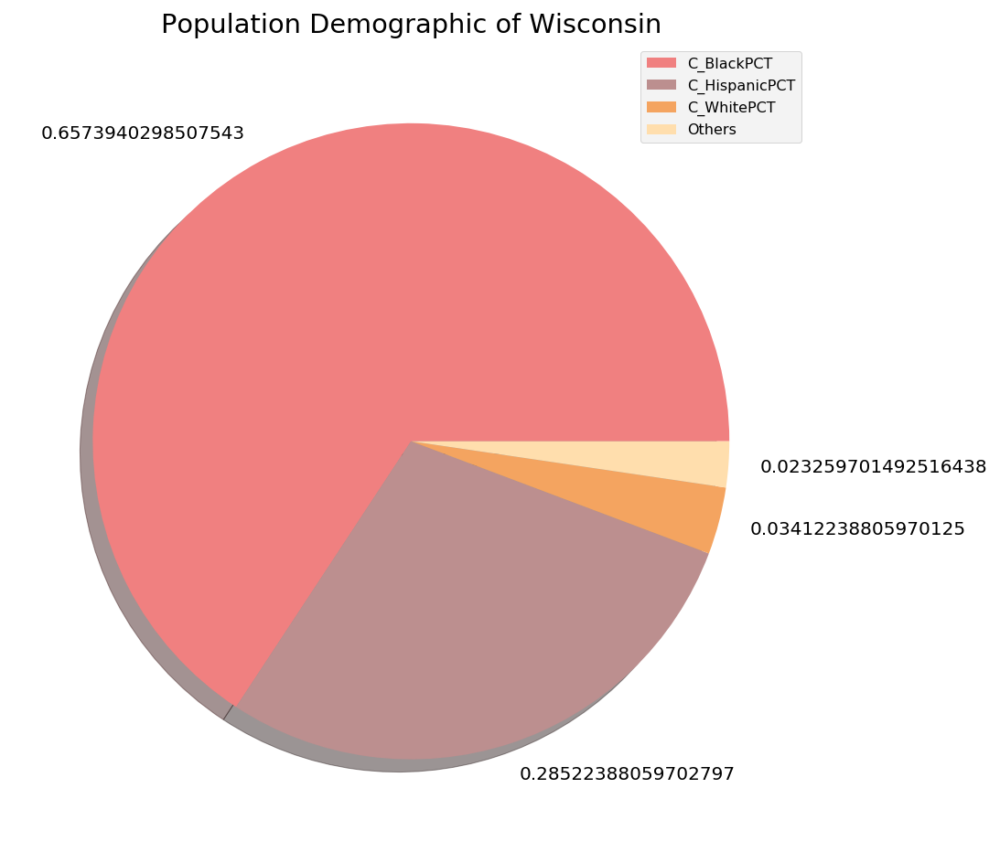

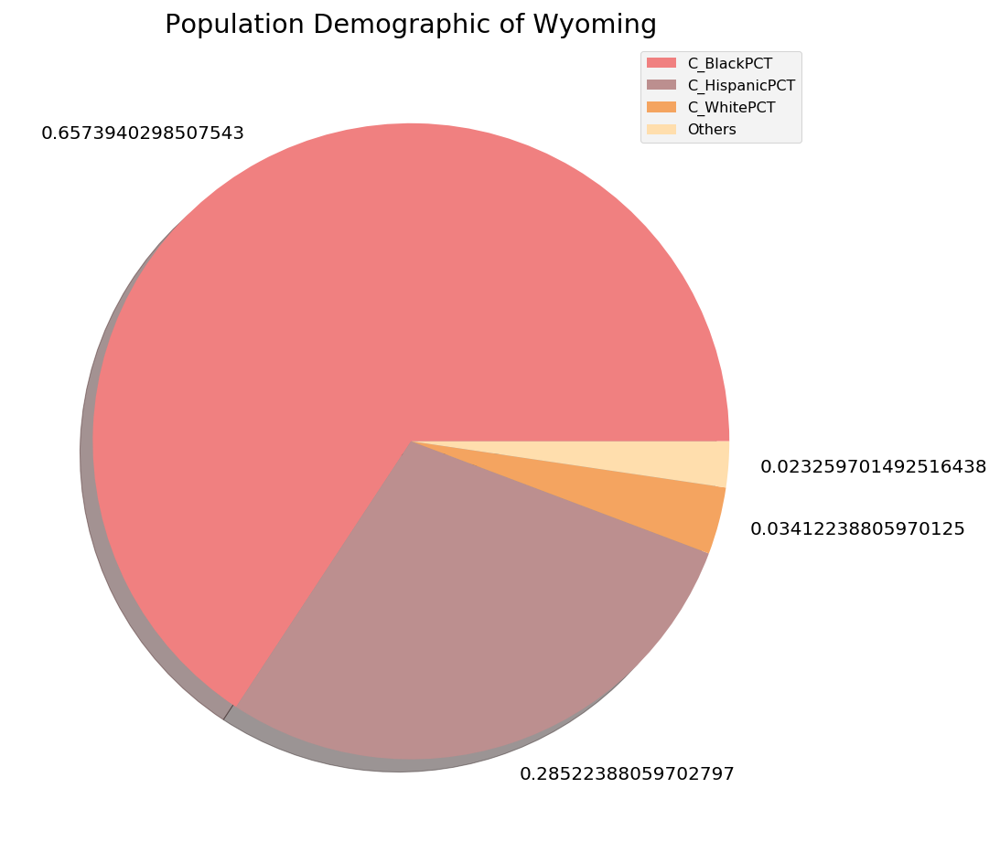

In [314]:
c = ['lightcoral', 'rosybrown', 'sandybrown', 'navajowhite', 'gold',
        'khaki', 'lightskyblue', 'turquoise', 'lightslategrey', 'thistle', 'pink']
labels=[ 'C_BlackPCT', 'C_HispanicPCT', 'C_WhitePCT',
       'Others']
for state in Demographics_df2['state']:
    var=[]
    for indx in Demographics_df2[Demographics_df2['state']=='Alabama'].index:
        var.append(Demographics_df2['C_WhitePCT'][indx])
        var.append(Demographics_df2['C_BlackPCT'][indx])
        var.append(Demographics_df2['C_HispanicPCT'][indx])
        var.append(Demographics_df2['Others'][indx])
        plt.figure(figsize=(14,8))
        plt.title("Population Demographic of {}".format(state))
        plt.pie(var,colors=c,shadow=True, labels=var)
        plt.legend(labels, loc='upper right', fontsize=8)
        plt.show()